In [68]:
# Generating the plant architecture 
from CPlantBox_PiafMunch import * #import all the libraries
rs = pb.Plant()
p0 = pb.RootRandomParameter(rs)  # with default values,
p1 = pb.RootRandomParameter(rs)  # all standard deviations are 0
s1 = pb.StemRandomParameter(rs)
s2 = pb.StemRandomParameter(rs)
s3 = pb.StemRandomParameter(rs)
s4 = pb.StemRandomParameter(rs)
l1 = pb.LeafRandomParameter(rs)
l2 = pb.LeafRandomParameter(rs)

p0.name = "taproot"
p0.a = 0.2  # [cm] radius
p0.subType = 1  # [-] index starts at 1
p0.lb = 5  # [cm] basal zone
p0.la = 10  # [cm] apical zone
p0.lmax = 30  # [cm] maximal root length, number of lateral branching nodes = round((lmax-lb-la)/ln) + 1
p0.ln = 1.  # [cm] inter-lateral distance (16 branching nodes)
p0.theta = 0.  # [rad]
p0.r = 1  # [cm/day] initial growth rate
p0.dx = 10  # [cm] axial resolution
p0.successor = [2]  # add successors
p0.successorP = [1]  # probability that successor emerges
p0.tropismT = pb.TropismType.gravi  #
p0.tropismN = 1.8  # [-] strength of tropism
p0.tropismS = 0.2  # [rad/cm] maximal bending

p1.name = "lateral"
p1.a = 0.1  # [cm] radius
p1.subType = 2  # [1] index starts at 1
p1.lmax = 15  # # [cm] apical zone
p1.lmaxs = 0.15  # [cm] standard deviation of the apical zone
p1.theta = 90. / 180. * np.pi  # [rad]
p1.r = 2  # initial growth rate
p1.dx = 1  # [cm] axial resolution
p1.tropismT = pb.TropismType.gravi  # exo
p1.tropismN = 2  # [-] strength of tropism
p1.tropismS = 0.1  # [rad/cm] maximal bending

s1.name = "mainstem"
s1.subType = 1

s1.lmax = 50
s1.lb = 2
s1.la = 1
s1.ln = 4
s1.lnf = 0
s1.RotBeta = 0
s1.BetaDev = 0
s1.InitBeta = 0
s1.gf = 1
s1.successor = [5,2]
s1.successorP = [0.5,0.5]
s1.tropismT = 4
s1.theta = 0.
s1.tropismN = 18
s1.tropismS = 0.01
s1.r = 1



s3.name = "invisible stem"
s3.subType = 2
s3.lmax = 5
s3.la = 0
s3.ln = 0
s3.RotBeta = 0
s3.BetaDev = 0
s3.InitBeta = 0.
s3.lb = 0
s3.la = 0
s3.ln = 0
s3.lnf = 0
s3.RotBeta = 2 / 3
s3.BetaDev = 0
s3.InitBeta = 0
s3.gf = 1
s3.tropismT = 1
s3.theta = 0.3
s3.tropismN = 18
s3.tropismS = 0.01
s3.r = 1


s2.name = "secondary_stem"
s2.subType = 5
s2.lmax = 10
s2.lb = 0
s2.la = 2
s2.ln = 2
s2.lnf = 0
s2.RotBeta = 2 / 3
s2.BetaDev = 0
s2.InitBeta = 0
s2.gf = 1
s2.successor = [2]
s2.successorP = [1]
s2.tropismT = 4
s2.theta = 0.3
s2.tropismN = 18
s2.tropismS = 0.01
s2.r = 0.5

l1.name = 'leaf_under_second_stem'
l1.subType = 2
l1.lb = 2
l1.la = 0.2
l1.lmax = 5
l1.r = 0.5
l1.RotBeta = 0.5
l1.BetaDev = 0
l1.InitBeta = 0.
l1.tropismT = 1
l1.tropismN = 5
l1.tropismS = 0.15
l1.theta = 0.35
l1.gf = 1

l2.name = 'leaf_on_second_stem'
l2.subType = 3
l2.lb = 2
l2.la = 0.2
l2.lmax = 5
l2.r = 0.5
l2.RotBeta = 0.5
l2.BetaDev = 0
l2.InitBeta = 0.
l2.tropismT = 1
l2.tropismN = 5
l2.tropismS = 0.15
l2.theta = 0.35
l2.gf = 1

s4.name = "rosette"
s4.subType = 4
s4.lmax = 2
s4.lb = 1
s4.la = 0
s4.ln = 2
s4.lnf = 0
s4.RotBeta = 1 / 5
s4.BetaDev = 0
s4.InitBeta = 0
s4.gf = 1
s4.tropismT = 1
s4.theta = 0.3
s4.tropismN = 18
s4.tropismS = 0.01
s4.r = 0.5

rs.setOrganRandomParameter(p0)
rs.setOrganRandomParameter(p1)
rs.setOrganRandomParameter(s1)
rs.setOrganRandomParameter(s2)
rs.setOrganRandomParameter(s3)
rs.setOrganRandomParameter(s4)
rs.setOrganRandomParameter(l1)

srp = pb.SeedRandomParameter(rs)  # with default values
srp.seedPos = pb.Vector3d(0., 0., -3.)  # [cm] seed position
srp.maxB = 0  # [-] number of basal roots (neglecting basal roots and shoot borne)
srp.firstB = 10.  # [day] first emergence of a basal root
srp.delayB = 3.  # [day] delay between the emergence of basal roots
srp.maxTil = 10
rs.setOrganRandomParameter(srp)

#  Simulating the plant growth

time = 70

rs.initialize(True)

rs.simulate(time)

fig = visual_plant(rs)

fig.show()

In [8]:
df

,time,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,...,c_demand_2,growth_rate,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2
0,1,1,2,1,4,0,0,0,0.000000,0.000000,...,NaN,NaN,NaN,1,NaN,0.000000,0.000000e+00,-0.020000,1.0,2.0
1,1,2,2,1,2,0,1,0,0.002500,0.000035,...,NaN,NaN,NaN,1,NaN,0.002141,1.895826e-04,-0.021278,2.0,3.0
2,1,3,2,1,2,0,1,0,0.005000,0.000035,...,NaN,NaN,NaN,1,NaN,0.004264,3.448100e-04,-0.022587,3.0,4.0
3,1,4,2,1,2,0,1,0,0.007500,0.000035,...,NaN,NaN,NaN,1,NaN,0.006195,5.603452e-04,-0.024161,4.0,5.0
4,1,5,2,1,2,0,1,0,0.010000,0.000035,...,NaN,NaN,NaN,1,NaN,0.008159,6.799937e-04,-0.025703,5.0,6.0
5,1,6,2,1,2,0,1,0,0.012500,0.000035,...,NaN,NaN,NaN,1,NaN,0.009902,8.493801e-04,-0.027487,6.0,7.0
6,1,7,2,1,2,0,1,0,0.015000,0.000035,...,NaN,NaN,NaN,1,NaN,0.011429,1.239496e-03,-0.029428,7.0,8.0
7,1,8,2,1,2,0,1,0,0.017500,0.000035,...,NaN,NaN,NaN,1,NaN,0.012953,1.611274e-03,-0.031374,8.0,9.0
8,1,9,2,1,1,0,1,0,0.019277,0.000035,...,0.014318,6.148777e-01,0.000000,1,1.927722,0.014036,1.874131e-03,-0.032759,1.0,10.0
9,1,10,2,4,2,1,2,0,0.002500,0.000035,...,NaN,NaN,NaN,1,NaN,0.002308,1.856104e-04,-0.020943,10.0,11.0


In [2]:
import pandas as pd
df = pd.read_csv("small_2020_low_st.xml_60_0.1_0.1_0.1.csv")
# df= pd.read_csv("small_2020.xml_60_1.5_1.2_0.6.csv")

In [13]:
help(px.scatter_3d)

Help on function scatter_3d in module plotly.express._chart_types:

scatter_3d(data_frame=None, x=None, y=None, z=None, color=None, symbol=None, size=None, text=None, hover_name=None, hover_data=None, custom_data=None, error_x=None, error_x_minus=None, error_y=None, error_y_minus=None, error_z=None, error_z_minus=None, animation_frame=None, animation_group=None, category_orders={}, labels={}, size_max=None, color_discrete_sequence=None, color_discrete_map={}, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, symbol_sequence=None, symbol_map={}, opacity=None, log_x=False, log_y=False, log_z=False, range_x=None, range_y=None, range_z=None, title=None, template=None, width=None, height=None)
        In a 3D scatter plot, each row of `data_frame` is represented by a symbol mark in 3D space.
        
    Arguments:
        data_frame: A `pandas.DataFrame`, or a `NumPy` array or a dictionary which are tranformed internally to `pandas.DataFrame`. This argument nee

In [78]:
import plotly.express as px
import pandas as pd
# df = pd.read_csv("small_2020_low_st.xml_60_0.1_0.1_0.1.csv")
# df= pd.read_csv("small_2020.xml_60_1.5_1.2_0.6.csv")
df = pd.read_csv("small_2020_l.xml_30_0.1_0.1_0.1.csv")



fig = px.scatter_3d(df, x="coor_x", y="coor_y", z = "coor_z" ,animation_frame="time", animation_group="order",
           size="connect_no", color="sub_type", hover_name="id",
           log_x=False)
plotly.offline.plot(fig, filename='id_offline.html')

fig.update_traces(marker=dict(size=8,
                              line=dict(width=0,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [143]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv")
c1 = df[df["time"] == 59]["connection_1"].tolist()
c2 = df[df["time"] == 59]["connection_1"].tolist()
cx = df[df["time"] == 59]["coor_x"].tolist()
cy = df[df["time"] == 59]["coor_y"].tolist()
cz= df[df["time"] == 59]["coor_z"].tolist()
cst= df[df["time"] == 59]["r_st"].tolist()
cxyl= df[df["time"] == 59]["r_xyl"].tolist()
cc= df[df["time"] == 59]["connect_no"].tolist()

cxyl1 = map(lambda x: x/10, cxyl)

con_x = []
con_y = []
con_z = []
ccc = []
for i in range(0, len(c1)-1):
    con_x.append( (cx[int(c1[i]-1)] + cx[int(c2[i]-1)] )/2    )
    con_y.append( (cy[int(c1[i]-1)] + cy[int(c2[i]-1)] )/2    )
    con_z.append( (cz[int(c1[i]-1)] + cz[int(c2[i]-1)] )/2    )
    ccc.append(cc[int(c1[i]-1)])
df2 = pd.DataFrame(list(zip(con_x, con_y,con_z, cst, cxyl1,ccc)), 
               columns =['con_x', 'con_y','con_z', 'cst', 'cxyl1','ccc']) 
    
px.scatter_3d(df2, x="con_x", y="con_y", z = "con_z" ,
           size="ccc", color="cxyl1",  
           log_x=False)

In [146]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("small_2020_abs.xml_60_0.1_0.1_0.1.csv")

c1 = df[df["time"] == 59]["connection_1"].tolist()
c2 = df[df["time"] == 59]["connection_1"].tolist()
cx = df[df["time"] == 59]["coor_x"].tolist()
cy = df[df["time"] == 59]["coor_y"].tolist()
cz= df[df["time"] == 59]["coor_z"].tolist()
cst= df[df["time"] == 59]["r_st"].tolist()
cxyl= df[df["time"] == 59]["r_xyl"].tolist()
cc= df[df["time"] == 59]["connect_no"].tolist()

cxyl1 = map(lambda x: x/1, cxyl)

con_x = []
con_y = []
con_z = []
ccc = []
for i in range(0, len(c1)-1):
    con_x.append( (cx[int(c1[i]-1)] + cx[int(c2[i]-1)] )/2    )
    con_y.append( (cy[int(c1[i]-1)] + cy[int(c2[i]-1)] )/2    )
    con_z.append( (cz[int(c1[i]-1)] + cz[int(c2[i]-1)] )/2    )
    ccc.append(cc[int(c1[i]-1)])
df2 = pd.DataFrame(list(zip(con_x, con_y,con_z, cst, cxyl1,ccc)), 
               columns =['con_x', 'con_y','con_z', 'cst', 'cxyl1','ccc']) 
    
px.scatter_3d(df2, x="con_x", y="con_y", z = "con_z" ,
           size="ccc", color="cxyl1",  
           log_x=False)

In [66]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv")
c1 = df[df["time"] == 59]["connection_1"].tolist()
c2 = df[df["time"] == 59]["connection_1"].tolist()
cx = df[df["time"] == 59]["coor_x"].tolist()
cy = df[df["time"] == 59]["coor_y"].tolist()
cz= df[df["time"] == 59]["coor_z"].tolist()
cst= df[df["time"] == 59]["r_st"].tolist()
cxyl= df[df["time"] == 59]["r_xyl"].tolist()
cc= df[df["time"] == 59]["connect_no"].tolist()



con_x = []
con_y = []
con_z = []
for i in range(0, len(c1)-1):
    con_x.append( (cx[int(c1[i]-1)] + cx[int(c2[i]-1)] )/2    )
    con_y.append( (cy[int(c1[i]-1)] + cy[int(c2[i]-1)] )/2    )
    con_z.append( (cz[int(c1[i]-1)] + cz[int(c2[i]-1)] )/2    )

df2 = pd.DataFrame(list(zip(con_x, con_y,con_z, cst, cxyl,cc)), 
               columns =['con_x', 'con_y','con_z', 'cst', 'cxyl','cc']) 
    
px.scatter_3d(df2, x="con_x", y="con_y", z = "con_z" ,
           size="cc", color="cxyl",  
           log_x=False)



In [25]:
df[df["time"] == 3][df["id"] == df.iloc[2]["id"]]

/home/zxrzxr/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,time,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,...,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2,r_xyl,r_st
100,3,3,2,1,2,0,1,0,0.005,0.000035,...,NaN,1,NaN,0.003076,-0.002331,-0.023177,3.0,4.0,0.013169,0.004


In [39]:
aa = df[df["time"] == 3][df["id"] == df.iloc[2]["id"]]["coor_x"]
print(aa )

100    0.003076
Name: coor_x, dtype: float64


/home/zxrzxr/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [40]:
con_x = []
con_y = []
con_z = []
for i, row in df.iterrows():
    x1 = df[df["time"] == row["time"]][df["id"] == row["connection_1"]]["coor_x"]
    x2 = df[df["time"] == row["time"]][df["id"] == row["connection_2"]]["coor_x"]
    print(x1, x2)
#     con_x.append(  )

/home/zxrzxr/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



0    0.0
Name: coor_x, dtype: float64 1    0.0015
Name: coor_x, dtype: float64
1    0.0015
Name: coor_x, dtype: float64 2    0.003076
Name: coor_x, dtype: float64
2    0.003076
Name: coor_x, dtype: float64 3    0.00467
Name: coor_x, dtype: float64
3    0.00467
Name: coor_x, dtype: float64 4    0.006433
Name: coor_x, dtype: float64
4    0.006433
Name: coor_x, dtype: float64 5    0.008228
Name: coor_x, dtype: float64
5    0.008228
Name: coor_x, dtype: float64 6    0.010021
Name: coor_x, dtype: float64
6    0.010021
Name: coor_x, dtype: float64 7    0.011827
Name: coor_x, dtype: float64
7    0.011827
Name: coor_x, dtype: float64 8    0.013117
Name: coor_x, dtype: float64
0    0.0
Name: coor_x, dtype: float64 9   -0.001284
Name: coor_x, dtype: float64
9   -0.001284
Name: coor_x, dtype: float64 10   -0.002508
Name: coor_x, dtype: float64
10   -0.002508
Name: coor_x, dtype: float64 11   -0.003714
Name: coor_x, dtype: float64
11   -0.003714
Name: coor_x, dtype: float64 12   -0.004885
Name: co

Name: coor_x, dtype: float64 99    0.0015
Name: coor_x, dtype: float64
99    0.0015
Name: coor_x, dtype: float64 100    0.003076
Name: coor_x, dtype: float64
100    0.003076
Name: coor_x, dtype: float64 101    0.00467
Name: coor_x, dtype: float64
101    0.00467
Name: coor_x, dtype: float64 102    0.006433
Name: coor_x, dtype: float64
102    0.006433
Name: coor_x, dtype: float64 103    0.008228
Name: coor_x, dtype: float64
103    0.008228
Name: coor_x, dtype: float64 104    0.010021
Name: coor_x, dtype: float64
104    0.010021
Name: coor_x, dtype: float64 105    0.011827
Name: coor_x, dtype: float64
105    0.011827
Name: coor_x, dtype: float64 106    0.013401
Name: coor_x, dtype: float64
106    0.013401
Name: coor_x, dtype: float64 136    0.014816
Name: coor_x, dtype: float64
136    0.014816
Name: coor_x, dtype: float64 137    0.016336
Name: coor_x, dtype: float64
137    0.016336
Name: coor_x, dtype: float64 138    0.017631
Name: coor_x, dtype: float64
138    0.017631
Name: coor_x, dtyp

198    0.013401
Name: coor_x, dtype: float64 228    0.014816
Name: coor_x, dtype: float64
228    0.014816
Name: coor_x, dtype: float64 229    0.016336
Name: coor_x, dtype: float64
229    0.016336
Name: coor_x, dtype: float64 230    0.017631
Name: coor_x, dtype: float64
230    0.017631
Name: coor_x, dtype: float64 231    0.018729
Name: coor_x, dtype: float64
231    0.018729
Name: coor_x, dtype: float64 258    0.019248
Name: coor_x, dtype: float64
258    0.019248
Name: coor_x, dtype: float64 259    0.020154
Name: coor_x, dtype: float64
259    0.020154
Name: coor_x, dtype: float64 260    0.021085
Name: coor_x, dtype: float64
260    0.021085
Name: coor_x, dtype: float64 288    0.022
Name: coor_x, dtype: float64
288    0.022
Name: coor_x, dtype: float64 289    0.022968
Name: coor_x, dtype: float64
289    0.022968
Name: coor_x, dtype: float64 290    0.024155
Name: coor_x, dtype: float64
290    0.024155
Name: coor_x, dtype: float64 291    0.02524
Name: coor_x, dtype: float64
291    0.02524
Na

215    0.0
Name: coor_x, dtype: float64 190    0.0
Name: coor_x, dtype: float64
216    0.0
Name: coor_x, dtype: float64 215    0.0
Name: coor_x, dtype: float64
217    0.0
Name: coor_x, dtype: float64 216    0.0
Name: coor_x, dtype: float64
218    0.0
Name: coor_x, dtype: float64 217    0.0
Name: coor_x, dtype: float64
222    0.0
Name: coor_x, dtype: float64 218    0.0
Name: coor_x, dtype: float64
223    0.0
Name: coor_x, dtype: float64 222    0.0
Name: coor_x, dtype: float64
224    0.0
Name: coor_x, dtype: float64 223    0.0
Name: coor_x, dtype: float64
249    0.0
Name: coor_x, dtype: float64 224    0.0
Name: coor_x, dtype: float64
250    0.0
Name: coor_x, dtype: float64 249    0.0
Name: coor_x, dtype: float64
251    0.0
Name: coor_x, dtype: float64 250    0.0
Name: coor_x, dtype: float64
252    0.0
Name: coor_x, dtype: float64 251    0.0
Name: coor_x, dtype: float64
278    0.0
Name: coor_x, dtype: float64 252    0.0
Name: coor_x, dtype: float64
281    0.0
Name: coor_x, dtype: float64 

392   -0.014561
Name: coor_x, dtype: float64 393   -0.016437
Name: coor_x, dtype: float64
393   -0.016437
Name: coor_x, dtype: float64 394   -0.0182
Name: coor_x, dtype: float64
394   -0.0182
Name: coor_x, dtype: float64 395   -0.020021
Name: coor_x, dtype: float64
395   -0.020021
Name: coor_x, dtype: float64 423   -0.021896
Name: coor_x, dtype: float64
423   -0.021896
Name: coor_x, dtype: float64 424   -0.023775
Name: coor_x, dtype: float64
424   -0.023775
Name: coor_x, dtype: float64 425   -0.025814
Name: coor_x, dtype: float64
425   -0.025814
Name: coor_x, dtype: float64 426   -0.027856
Name: coor_x, dtype: float64
426   -0.027856
Name: coor_x, dtype: float64 427   -0.029819
Name: coor_x, dtype: float64
427   -0.029819
Name: coor_x, dtype: float64 428   -0.031761
Name: coor_x, dtype: float64
428   -0.031761
Name: coor_x, dtype: float64 459   -0.033777
Name: coor_x, dtype: float64
459   -0.033777
Name: coor_x, dtype: float64 460   -0.035616
Name: coor_x, dtype: float64
460   -0.03561

550    0.021085
Name: coor_x, dtype: float64 578    0.022
Name: coor_x, dtype: float64
578    0.022
Name: coor_x, dtype: float64 579    0.022968
Name: coor_x, dtype: float64
579    0.022968
Name: coor_x, dtype: float64 580    0.024155
Name: coor_x, dtype: float64
580    0.024155
Name: coor_x, dtype: float64 581    0.02524
Name: coor_x, dtype: float64
581    0.02524
Name: coor_x, dtype: float64 582    0.025891
Name: coor_x, dtype: float64
582    0.025891
Name: coor_x, dtype: float64 615    0.026449
Name: coor_x, dtype: float64
615    0.026449
Name: coor_x, dtype: float64 616    0.027367
Name: coor_x, dtype: float64
616    0.027367
Name: coor_x, dtype: float64 617    0.028301
Name: coor_x, dtype: float64
617    0.028301
Name: coor_x, dtype: float64 618    0.029067
Name: coor_x, dtype: float64
618    0.029067
Name: coor_x, dtype: float64 643    0.029859
Name: coor_x, dtype: float64
643    0.029859
Name: coor_x, dtype: float64 644    0.030618
Name: coor_x, dtype: float64
644    0.030618
Na

601   -0.000359
Name: coor_x, dtype: float64 602    0.000216
Name: coor_x, dtype: float64
602    0.000216
Name: coor_x, dtype: float64 603    0.000813
Name: coor_x, dtype: float64
603    0.000813
Name: coor_x, dtype: float64 604    0.001727
Name: coor_x, dtype: float64
604    0.001727
Name: coor_x, dtype: float64 633    0.002472
Name: coor_x, dtype: float64
633    0.002472
Name: coor_x, dtype: float64 634    0.003528
Name: coor_x, dtype: float64
634    0.003528
Name: coor_x, dtype: float64 635    0.004621
Name: coor_x, dtype: float64
635    0.004621
Name: coor_x, dtype: float64 636    0.005382
Name: coor_x, dtype: float64
636    0.005382
Name: coor_x, dtype: float64 657    0.006132
Name: coor_x, dtype: float64
657    0.006132
Name: coor_x, dtype: float64 658    0.006981
Name: coor_x, dtype: float64
658    0.006981
Name: coor_x, dtype: float64 659    0.007802
Name: coor_x, dtype: float64
659    0.007802
Name: coor_x, dtype: float64 660    0.008675
Name: coor_x, dtype: float64
500   -0.0

829    0.032107
Name: coor_x, dtype: float64 848    0.032831
Name: coor_x, dtype: float64
848    0.032831
Name: coor_x, dtype: float64 849    0.033544
Name: coor_x, dtype: float64
849    0.033544
Name: coor_x, dtype: float64 850    0.034223
Name: coor_x, dtype: float64
850    0.034223
Name: coor_x, dtype: float64 851    0.035075
Name: coor_x, dtype: float64
851    0.035075
Name: coor_x, dtype: float64 852    0.035148
Name: coor_x, dtype: float64
667    0.006433
Name: coor_x, dtype: float64 698    0.007585
Name: coor_x, dtype: float64
698    0.007585
Name: coor_x, dtype: float64 699    0.009053
Name: coor_x, dtype: float64
699    0.009053
Name: coor_x, dtype: float64 700    0.010562
Name: coor_x, dtype: float64
700    0.010562
Name: coor_x, dtype: float64 726    0.012049
Name: coor_x, dtype: float64
726    0.012049
Name: coor_x, dtype: float64 727    0.013691
Name: coor_x, dtype: float64
727    0.013691
Name: coor_x, dtype: float64 728    0.015543
Name: coor_x, dtype: float64
728    0.0

718   -0.002897
Name: coor_x, dtype: float64 747   -0.002452
Name: coor_x, dtype: float64
747   -0.002452
Name: coor_x, dtype: float64 748   -0.001987
Name: coor_x, dtype: float64
748   -0.001987
Name: coor_x, dtype: float64 749   -0.001431
Name: coor_x, dtype: float64
749   -0.001431
Name: coor_x, dtype: float64 783   -0.000926
Name: coor_x, dtype: float64
783   -0.000926
Name: coor_x, dtype: float64 784   -0.000359
Name: coor_x, dtype: float64
784   -0.000359
Name: coor_x, dtype: float64 785    0.000216
Name: coor_x, dtype: float64
785    0.000216
Name: coor_x, dtype: float64 786    0.000813
Name: coor_x, dtype: float64
786    0.000813
Name: coor_x, dtype: float64 787    0.001727
Name: coor_x, dtype: float64
787    0.001727
Name: coor_x, dtype: float64 816    0.002472
Name: coor_x, dtype: float64
816    0.002472
Name: coor_x, dtype: float64 817    0.003528
Name: coor_x, dtype: float64
817    0.003528
Name: coor_x, dtype: float64 818    0.004621
Name: coor_x, dtype: float64
818    0.0

966    0.022968
Name: coor_x, dtype: float64 967    0.024155
Name: coor_x, dtype: float64
967    0.024155
Name: coor_x, dtype: float64 968    0.02524
Name: coor_x, dtype: float64
968    0.02524
Name: coor_x, dtype: float64 969    0.025891
Name: coor_x, dtype: float64
969    0.025891
Name: coor_x, dtype: float64 1002    0.026449
Name: coor_x, dtype: float64
1002    0.026449
Name: coor_x, dtype: float64 1003    0.027367
Name: coor_x, dtype: float64
1003    0.027367
Name: coor_x, dtype: float64 1004    0.028301
Name: coor_x, dtype: float64
1004    0.028301
Name: coor_x, dtype: float64 1005    0.029067
Name: coor_x, dtype: float64
1005    0.029067
Name: coor_x, dtype: float64 1030    0.029859
Name: coor_x, dtype: float64
1030    0.029859
Name: coor_x, dtype: float64 1031    0.030618
Name: coor_x, dtype: float64
1031    0.030618
Name: coor_x, dtype: float64 1032    0.031246
Name: coor_x, dtype: float64
1032    0.031246
Name: coor_x, dtype: float64 1033    0.032107
Name: coor_x, dtype: float

973   -0.027856
Name: coor_x, dtype: float64 974   -0.029819
Name: coor_x, dtype: float64
974   -0.029819
Name: coor_x, dtype: float64 975   -0.031761
Name: coor_x, dtype: float64
975   -0.031761
Name: coor_x, dtype: float64 1006   -0.033777
Name: coor_x, dtype: float64
1006   -0.033777
Name: coor_x, dtype: float64 1007   -0.035616
Name: coor_x, dtype: float64
1007   -0.035616
Name: coor_x, dtype: float64 1008   -0.037356
Name: coor_x, dtype: float64
1008   -0.037356
Name: coor_x, dtype: float64 1009   -0.039176
Name: coor_x, dtype: float64
1009   -0.039176
Name: coor_x, dtype: float64 1010   -0.040992
Name: coor_x, dtype: float64
1010   -0.040992
Name: coor_x, dtype: float64 1034   -0.042829
Name: coor_x, dtype: float64
1034   -0.042829
Name: coor_x, dtype: float64 1035   -0.04482
Name: coor_x, dtype: float64
1035   -0.04482
Name: coor_x, dtype: float64 1036   -0.046679
Name: coor_x, dtype: float64
1036   -0.046679
Name: coor_x, dtype: float64 1057   -0.048755
Name: coor_x, dtype: flo

KeyboardInterrupt: 

In [46]:
c1 = df[df["time"] == 59]["connection_1"].tolist()
c2 = df[df["time"] == 59]["connection_1"].tolist()
cx = df[df["time"] == 59]["coor_x"].tolist()
cy = df[df["time"] == 59]["coor_y"].tolist()
cz= df[df["time"] == 59]["coor_z"].tolist()
cst= df[df["time"] == 59]["r_st"].tolist()
cxyl= df[df["time"] == 59]["r_xyl"].tolist()

con_x = []
con_y = []
con_z = []
for i in range(0, len(c1)-1):
    con_x.append( (cx[int(c1[i])] + cx[int(c2[i])] )/2    )
    con_y.append( (cy[int(c1[i])] + cy[int(c2[i])] )/2    )
    con_z.append( (cz[int(c1[i])] + cz[int(c2[i])] )/2    )

In [79]:
from plotly.subplots import make_subplots
from itertools import cycle
import numpy as np
# Generating the plant architecture 
# from CPlantBox_PiafMunch import * #import all the libraries

# water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
#                 [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
#                 [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
# name = "small_2020.xml"
# time_total = 60
# name_list = []
# for i, water_p in enumerate(water_p_list):
#     water_dry, water_middle, water_wet =  water_p
#     output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
#     name_list.append("{}.csv".format(output_name))


# plotly_colors = [['blue', 'darkgreen',"lightgreen",  'lightgreen' , "darkgrey",  
#                            'red'], 
#                           [ 'darkgrey',  
#                            'lightgrey'] ,
#                           [ 'red',  
#                            'orange']  
#                            ]





fig =  make_subplots(rows=1, cols=1,
                    specs=[[{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )



df = pd.read_csv("small_2020_low_st.xml_60_0.1_0.1_0.1.csv")
t = nnn
test = df[df["time"] ==t ]
organ_number = df[df["time"] ==t]["organ_id"].max()
features = []
organs = []
orders = []
waters = []

i =0
for i in range(int(organ_number)+1):
    ogs = test[test["organ_id"] == i]
    missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
#     print(   i, missing_2nd_id)
    if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
        missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
    else:
        missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
    missing_node = test[test["id"] == missing_1st_id]
    ms = missing_node.copy(deep=True)
#     print(ms["id"].tolist())
    ms.loc[:,"organ_id"]= i
#     print(ms)
    test=test.append(ms)


df = test.sort_index()

for i in range(organ_number+1):
    corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
    cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
    corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
    organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
    order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()
    water=df[df["time"] ==t ][df["organ_id"] == i]["root_water"].tolist()

    features.append([corx, cory, corz])
    organs.append(organ_id)
    orders.append(order)
    waters.append(water)



legend_groups = [l[-1] for l in waters]

traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
          else True for i, l in enumerate(legend_groups)]

cm = plotly_color_map(set(legend_groups))




for i, feat in enumerate(features):
    feat = np.array(feat)
    fig.add_trace(
        go.Scatter3d(
            x=feat[0,:],
            y=feat[1,:],
            z=feat[2,:],
#             mode='lines+markers',
            mode='lines',
            line={"c":, "width" : 8},
#             marker=dict(
#             color=cm[legend_groups[i]],
#             size=0,
#             line=dict(
#                 color='MediumPurple',
#                 width=0
#             )
#         ),
            legendgroup=legend_groups[i],
            hovertext=orders[i],
            showlegend=traces[i],
            name="{} water potential root".format(legend_groups[i]),
        ),
        row=1, col=j+1
    )




# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=-0.3))


fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

SyntaxError: invalid syntax (<ipython-input-79-a20138b8e6cc>, line 99)

In [34]:
help(px.line_3d)

Help on function line_3d in module plotly.express._chart_types:

line_3d(data_frame=None, x=None, y=None, z=None, color=None, line_dash=None, text=None, line_group=None, hover_name=None, hover_data=None, custom_data=None, error_x=None, error_x_minus=None, error_y=None, error_y_minus=None, error_z=None, error_z_minus=None, animation_frame=None, animation_group=None, category_orders={}, labels={}, color_discrete_sequence=None, color_discrete_map={}, line_dash_sequence=None, line_dash_map={}, log_x=False, log_y=False, log_z=False, range_x=None, range_y=None, range_z=None, title=None, template=None, width=None, height=None)
        In a 3D line plot, each row of `data_frame` is represented as vertex of a polyline mark in 3D space.
        
    Arguments:
        data_frame: A `pandas.DataFrame`, or a `NumPy` array or a dictionary which are tranformed internally to `pandas.DataFrame`. This argument needsto be passed for column names (and not keyword names) to be used.
        x: (string or 

In [80]:
import plotly.graph_objects as go
from IPython.display import Image
from itertools import cycle
order1_root = df01["rw_satis"][df01["rw_satis"]["order"] == 1]
df = order1_root

colors = ['#531e7d', '#5e59b0', '#6d91bf', '#a7c0ca',  '#cfb19c', '#bf735d', '#9d3a4f',
          "rgb(255, 127, 14)",
          "rgb(44, 160, 44)",
          "rgb(214, 39, 40)"]

data =[go.Scatter3d(
        x=df['time'],
        y=df['organ_id'],
        z=df['rw_satis'],
        text=df['time'],
        textposition="top center",
        mode='markers',
        marker=dict(size=3,  color=colors),
        name=str(df['organ_id2'])
        )
    ]

h = 0.25
xm, xM = df['time'].min()-h, df['time'].max()+h
ym, yM = df['organ_id'].min()-h, df['organ_id'].max()+h
zm, zM = df['rw_satis'].min()-h, df['rw_satis'].max()+h

layout =go.Layout(width=600, height=600,
                  scene=dict(
                          xaxis =dict(range=[xm, xM]),
                          yaxis=dict(range=[ym, yM]),
                          zaxis=dict(range=[zm, zM]),
                  camera=dict(eye=dict(x=1.25, y=1.55, z= 1))),
                  
                 updatemenus=[dict(type='buttons', showactive=False,
                                y=0,
                                x=1.05,
                                xanchor='right',
                                yanchor='top',
                                pad=dict(t=0, r=10),
                                buttons=[dict(label='Play',
                                              method='animate',
                                              args=[None, 
                                                    dict(frame=dict(duration=50, 
                                                                    redraw=True),
                                                         transition=dict(duration=0),
                                                         fromcurrent=True,
                                                         mode='immediate')
                                                   ]
                                             )
                                        ]
                               )
                          ]     )

fig = go.Figure(data=data, layout=layout)
fig.show()
# fig.write_image("images/fig1.png")
# img_bytes = fig.to_image(format="png")
# Image(img_bytes)

NameError: name 'df01' is not defined

In [113]:
from plotly.subplots import make_subplots
from itertools import cycle

# compare 3 different plant
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_l.xml"
time_total = 30
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))


def plotly_color_map(names):

    plotly_colors = cycle(['#1f77b4',  # muted blue
                           '#ff7f0e',  # safety orange
                           '#2ca02c',  # cooked asparagus green
                           '#d62728',  # brick red
                           '#9467bd',  # muted purple
    '#8c564b',  # chestnut brown
    '#e377c2',  # raspberry yogurt pink
    '#7f7f7f',  # middle gray
    '#bcbd22',  # curry yellow-green
    '#17becf'   # blue-teal
                           ])

    return dict(zip(names, plotly_colors))


fig =  make_subplots(rows=1, cols=3,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )




for j,name in enumerate(name_list[1:2]):
    df = pd.read_csv(name)
    t = 29
    test = df[df["time"] ==t ]
    organ_number = df[df["time"] ==t]["organ_id"].max()
    features = []
    organs = []
    orders = []
    sub_types = []


    for i in range(organ_number+1):
        ogs = test[test["organ_id"] == i]
        missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
    #     print(   i, missing_2nd_id)
        if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
            missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
        else:
            missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
        missing_node = test[test["id"] == missing_1st_id]
        ms = missing_node.copy(deep=True)
    #     print(ms["id"].tolist())
        ms.loc[:,"organ_id"]= i
    #     print(ms)
        test=test.append(ms)


    df = test.sort_index()

    for i in range(organ_number+1):
        corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
        cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
        corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
        organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
        order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()
        sub_type=df[df["time"] ==t ][df["organ_id"] == i]["sub_type"].tolist()
        organ_id2=df[df["time"] ==t ][df["organ_id2"] == i]["organ_id"].tolist()
        features.append([corx, cory, corz])
        organs.append(organ_id2)
        orders.append(order)
        sub_types.append(sub_type)





    # features = [np.random.rand(4,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(6,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(9,2).tolist()]

    # labels = [[1, 1, 1, 1],
    #           [1, 1, 1, 1, 1],
    #           [2, 2, 2, 2, 2, 2],
    #           [2, 2, 2, 2, 2],
    #           [0, 0, 0, 0, 0, 0, 0, 0, 0]]

    legend_groups = [l[-1] for l in sub_types]

    traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
              else True for i, l in enumerate(legend_groups)]

    cm = plotly_color_map(set(legend_groups))




    for i, feat in enumerate(features):
        feat = np.array(feat)
        fig.add_trace(
            go.Scatter3d(
                x=feat[0,:],
                y=feat[1,:],
                z=feat[2,:],
    #             mode='lines+markers',
                mode='lines',
                line={"color":cm[legend_groups[i]], "width" : 8},
    #             marker=dict(
    #             color=cm[legend_groups[i]],
    #             size=0,
    #             line=dict(
    #                 color='MediumPurple',
    #                 width=0
    #             )
    #         ),
                legendgroup=legend_groups[i],
                hovertext=orders[i],
                showlegend=traces[i],
                name="sub_type{}".format(legend_groups[i]),
            ),
            row=1, col=j+1
        )
        


        
# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=0.1))
    

fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    height = 800,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

In [223]:
organs

[[0, 12, 12, 18, 18, 18, 18, 6],
 [0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  4,
  0,
  0,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [6,
  6,
  6,
  6,
  7,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  8,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  9,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  10,
  11,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,
  6,

In [26]:
organs

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
 [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
 [5, 5, 5, 5, 5, 5, 5, 5],
 [6, 6, 6, 6, 6, 6, 6],
 [7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,
  7,


In [29]:
from plotly.subplots import make_subplots
from itertools import cycle
import numpy as np
# Generating the plant architecture 
from CPlantBox_PiafMunch import * #import all the libraries

# water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
#                 [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
#                 [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
# name = "small_2020.xml"
# time_total = 60
# name_list = []
# for i, water_p in enumerate(water_p_list):
#     water_dry, water_middle, water_wet =  water_p
#     output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
#     name_list.append("{}.csv".format(output_name))


plotly_colors = [['blue', 'darkgrey',"lightgreen",  'lightgreen' , "darkgrey",  
                           'red', 'orange'], 
                          [ 'darkgrey',  
                           'lightgrey'] ,
                          [ 'red',  
                           'orange']  
                           ]



fig =  make_subplots(rows=1, cols=3,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )


nnn=59
# def runfig(nnn):
for j,name in enumerate(name_list[0:1]):
    def plotly_color_map(names):
        return dict(zip(names, plotly_colors[j]))
    df = pd.read_csv(name)
    t = nnn
    test = df[df["time"] ==t ]
    organ_number = df[df["time"] ==t]["organ_id"].max()
    features = []
    organs = []
    orders = []
    waters = []

    i =0
    for i in range(int(organ_number)+1):
        ogs = test[test["organ_id"] == i]
        missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
    #     print(   i, missing_2nd_id)
        if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
            missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
        else:
            missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
        missing_node = test[test["id"] == missing_1st_id]
        ms = missing_node.copy(deep=True)
    #     print(ms["id"].tolist())
        ms.loc[:,"organ_id"]= i
    #     print(ms)
        test=test.append(ms)


    df = test.sort_index()

    for i in range(organ_number+1):
        corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
        cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
        corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
        organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
        order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()
        water=df[df["time"] ==t ][df["organ_id"] == i]["root_water"].tolist()

        features.append([corx, cory, corz])
        organs.append(organ_id)
        orders.append(order)
        waters.append(water)



    legend_groups = [l[-1] for l in waters]

    traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
              else True for i, l in enumerate(legend_groups)]

    cm = plotly_color_map(set(legend_groups))




    for i, feat in enumerate(features):
        feat = np.array(feat)
        fig.add_trace(
            go.Scatter3d(
                x=feat[0,:],
                y=feat[1,:],
                z=feat[2,:],
    #             mode='lines+markers',
                mode='lines',
                line={"color":cm[legend_groups[i]], "width" : 8},
    #             marker=dict(
    #             color=cm[legend_groups[i]],
    #             size=0,
    #             line=dict(
    #                 color='MediumPurple',
    #                 width=0
    #             )
    #         ),
                legendgroup=legend_groups[i],
                hovertext=orders[i],
                showlegend=traces[i],
                name="{} water potential root".format(legend_groups[i]),
            ),
            row=1, col=j+1
        )




# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=-0.3))


fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

In [19]:
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))
df =  pd.read_csv(name_list[11])




In [10]:
from plotly.subplots import make_subplots
from itertools import cycle

water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_high_xyl_x_10.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

plotly_colors = [ 
                          [ 'darkgreen',  
                           'lightgreen'] ,['blue',  'lightblue' ],
                          [ 'red',  
                           'orange']  
                           ]



fig =  make_subplots(rows=1, cols=3,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )




for j,name in enumerate(name_list[1:2]):
    def plotly_color_map(names):
        return dict(zip(names, plotly_colors[j]))
    df = pd.read_csv(name)
    t = 29
    test = df[df["time"] ==t ]
    organ_number = df[df["time"] ==t]["organ_id"].max()
    features = []
    organs = []
    orders = []


    for i in range(organ_number+1):
        ogs = test[test["organ_id"] == i]
        missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
    #     print(   i, missing_2nd_id)
        if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
            missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
        else:
            missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
        missing_node = test[test["id"] == missing_1st_id]
        ms = missing_node.copy(deep=True)
    #     print(ms["id"].tolist())
        ms.loc[:,"organ_id"]= i
    #     print(ms)
        test=test.append(ms)


    df = test.sort_index()

    for i in range(organ_number+1):
        corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
        cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
        corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
        organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
        order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()

        features.append([corx, cory, corz])
        organs.append(organ_id)
        orders.append(order)






    # features = [np.random.rand(4,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(6,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(9,2).tolist()]

    # labels = [[1, 1, 1, 1],
    #           [1, 1, 1, 1, 1],
    #           [2, 2, 2, 2, 2, 2],
    #           [2, 2, 2, 2, 2],
    #           [0, 0, 0, 0, 0, 0, 0, 0, 0]]

    legend_groups = [l[1] for l in orders]

    traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
              else True for i, l in enumerate(legend_groups)]

    cm = plotly_color_map(set(legend_groups))




    for i, feat in enumerate(features):
        feat = np.array(feat)
        fig.add_trace(
            go.Scatter3d(
                x=feat[0,:],
                y=feat[1,:],
                z=feat[2,:],
    #             mode='lines+markers',
                mode='lines',
                line={"color":cm[legend_groups[i]], "width" : 8},
    #             marker=dict(
    #             color=cm[legend_groups[i]],
    #             size=0,
    #             line=dict(
    #                 color='MediumPurple',
    #                 width=0
    #             )
    #         ),
                legendgroup=legend_groups[i],
                hovertext=orders[i],
                showlegend=traces[i],
                name="{} order root".format(legend_groups[i]),
            ),
            row=1, col=j+1
        )
        


        
# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=0.1))
    

fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

In [67]:
from plotly.subplots import make_subplots
from itertools import cycle

water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_more_lateral.xml"
time_total = 30
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

plotly_colors = [['blue',  'lightblue' ], 
                          [ 'darkgrey',  
                           'lightgrey'] ,
                          [ 'red',  
                           'orange']  
                           ]



fig =  make_subplots(rows=1, cols=3,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )




for j,name in enumerate(name_list[0:3]):
    def plotly_color_map(names):
        return dict(zip(names, plotly_colors[j]))
    df = pd.read_csv(name)
    t = 29
    test = df[df["time"] ==t ]
    organ_number = df[df["time"] ==t]["organ_id"].max()
    features = []
    organs = []
    orders = []


    for i in range(organ_number+1):
        ogs = test[test["organ_id"] == i]
        missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
    #     print(   i, missing_2nd_id)
        if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
            missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
        else:
            missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
        missing_node = test[test["id"] == missing_1st_id]
        ms = missing_node.copy(deep=True)
    #     print(ms["id"].tolist())
        ms.loc[:,"organ_id"]= i
    #     print(ms)
        test=test.append(ms)


    df = test.sort_index()

    for i in range(organ_number+1):
        corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
        cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
        corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
        organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
        order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()

        features.append([corx, cory, corz])
        organs.append(organ_id)
        orders.append(order)






    # features = [np.random.rand(4,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(6,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(9,2).tolist()]

    # labels = [[1, 1, 1, 1],
    #           [1, 1, 1, 1, 1],
    #           [2, 2, 2, 2, 2, 2],
    #           [2, 2, 2, 2, 2],
    #           [0, 0, 0, 0, 0, 0, 0, 0, 0]]

    legend_groups = [l[1] for l in orders]

    traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
              else True for i, l in enumerate(legend_groups)]

    cm = plotly_color_map(set(legend_groups))




    for i, feat in enumerate(features):
        feat = np.array(feat)
        fig.add_trace(
            go.Scatter3d(
                x=feat[0,:],
                y=feat[1,:],
                z=feat[2,:],
    #             mode='lines+markers',
                mode='lines',
                line={"color":cm[legend_groups[i]], "width" : 8},
    #             marker=dict(
    #             color=cm[legend_groups[i]],
    #             size=0,
    #             line=dict(
    #                 color='MediumPurple',
    #                 width=0
    #             )
    #         ),
                legendgroup=legend_groups[i],
                hovertext=orders[i],
                showlegend=traces[i],
                name="{} order root".format(legend_groups[i]),
            ),
            row=1, col=j+1
        )
        


        
# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=0.1))
    

fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

NameError: name 'np' is not defined

In [156]:
from plotly.subplots import make_subplots
from itertools import cycle

water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

plotly_colors = [['#636EFA'], ['#EF553B'], ['#00CC96'], ['#AB63FA'], ['#FFA15A'], ['#19D3F3'], ['#FF6692'], 
                       ['#B6E880'], ['#FF97FF'], ['#FECB52'],['#636EFA'], ['#EF553B'], ['#00CC96'], ['#AB63FA'],[ '#FFA15A'],['#FFA15A'], ['#19D3F3'], ['#FF6692'], 
                       ['#B6E880'], ['#FF97FF'], ['#FECB52'],['#636EFA'],['#636EFA'], ['#EF553B'], ['#00CC96'], ['#AB63FA'],[ '#FFA15A'],['#FFA15A'], ['#19D3F3'], ['#FF6692'], 
                       ['#B6E880'], ['#FF97FF'], ['#FECB52'],['#636EFA']]



fig =  make_subplots(rows=1, cols=3,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}]],
                    print_grid=False, subplot_titles=("wet root","medium root", "dry root") )




for j,name in enumerate(name_list[0:3]):
    def plotly_color_map(names):
        return dict(zip(names, plotly_colors[j]))
    df = pd.read_csv(name)
    t = 59
    test = df[df["time"] ==t ]
    organ_number = df[df["time"] ==t]["organ_id"].max()
    features = []
    organs = []
    orders = []


    for i in range(organ_number+1):
        ogs = test[test["organ_id"] == i]
        missing_2nd_id = ogs[ogs["id"] == ogs["id"].min()]["id"].tolist()[0]
    #     print(   i, missing_2nd_id)
        if test[test["id"] == missing_2nd_id]["organ_type"].tolist()[0] < 3:
            missing_1st_id = test[test["connection_2"] == missing_2nd_id]["connection_1"].tolist()[0]
        else:
            missing_1st_id = test[test["connection_1"] == missing_2nd_id]["connection_2"].tolist()[0]
        missing_node = test[test["id"] == missing_1st_id]
        ms = missing_node.copy(deep=True)
    #     print(ms["id"].tolist())
        ms.loc[:,"organ_id"]= i
    #     print(ms)
        test=test.append(ms)


    df = test.sort_index()

    for i in range(organ_number+1):
        corx=df[df["time"] ==t ][df["organ_id"] == i]["coor_x"].tolist()
        cory=df[df["time"] ==t ][df["organ_id"] == i]["coor_y"].tolist()
        corz=df[df["time"] ==t ][df["organ_id"] == i]["coor_z"].tolist()
        organ_id=df[df["time"] ==t ][df["organ_id"] == i]["organ_id"].tolist()
        order=df[df["time"] ==t ][df["organ_id"] == i]["order"].tolist()

        features.append([corx, cory, corz])
        organs.append(organ_id)
        orders.append(order)






    # features = [np.random.rand(4,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(6,2).tolist(), 
    #             np.random.rand(5,2).tolist(), 
    #             np.random.rand(9,2).tolist()]

    # labels = [[1, 1, 1, 1],
    #           [1, 1, 1, 1, 1],
    #           [2, 2, 2, 2, 2, 2],
    #           [2, 2, 2, 2, 2],
    #           [0, 0, 0, 0, 0, 0, 0, 0, 0]]

    legend_groups = [l[1] for l in organs]

    traces = [False if (len(legend_groups[:i])>0 and l in legend_groups[:i]) 
              else True for i, l in enumerate(legend_groups)]

    cm = plotly_color_map(set(legend_groups))




    for i, feat in enumerate(features):
        feat = np.array(feat)
        fig.add_trace(
            go.Scatter3d(
                x=feat[0,:],
                y=feat[1,:],
                z=feat[2,:],
    #             mode='lines+markers',
                mode='lines',
                line={"color":cm[legend_groups[i]], "width" : 8},
    #             marker=dict(
    #             color=cm[legend_groups[i]],
    #             size=0,
    #             line=dict(
    #                 color='MediumPurple',
    #                 width=0
    #             )
    #         ),
                legendgroup=legend_groups[i],
                hovertext=orders[i],
                showlegend=traces[i],
                name="{} order root".format(legend_groups[i]),
            ),
            row=1, col=j+1
        )
        


        
# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
fig.update_layout(scene = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.update_layout(scene2 = scence,
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.update_layout(scene3 = scence,
                    width=1800,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


camera = dict(
eye=dict(x=0, y=2, z=0.1))
    

fig.update_layout(scene_camera=camera)
fig.update_layout(scene2_camera=camera)
fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=False, scene = dict(
                    xaxis_title='X AXIS ',
                    yaxis_title='Y AXIS ',
                    zaxis_title='Z AXIS '),
                    width=1000,
                    margin=dict(r=20, b=20, l=20, t=50), title_text= "plant structure by order")

fig.show()

KeyError: 1

In [ ]:
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_more_lateral.xml"
time_total = 30
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

In [87]:
"small_2020_more_lateral.xml_30_0.1_0.1_0.1.csv"
df

,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,carbon_q,...,c_demand_2,growth_rate,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2
time,,,,,,,,,,,,,,,,,,,,,
1,1,2,1,4,0,0,0,0.000000,0.000000,0.067508,...,NaN,NaN,NaN,1,NaN,0.000000,0.000000e+00,-0.020000,1.0,2.0
1,2,2,1,2,0,1,0,0.002500,0.000035,0.064859,...,NaN,NaN,NaN,1,NaN,0.000926,1.857494e-03,-0.021393,2.0,3.0
1,3,2,1,2,0,1,0,0.005000,0.000035,0.062493,...,NaN,NaN,NaN,1,NaN,0.001541,3.610249e-03,-0.023067,3.0,4.0
1,4,2,1,2,0,1,0,0.007500,0.000035,0.060057,...,NaN,NaN,NaN,1,NaN,0.001944,5.197622e-03,-0.024956,4.0,5.0
1,5,2,1,2,0,1,0,0.010000,0.000035,0.057533,...,NaN,NaN,NaN,1,NaN,0.002746,6.135279e-03,-0.027130,5.0,6.0
1,6,2,1,2,0,1,0,0.012500,0.000035,0.054913,...,NaN,NaN,NaN,1,NaN,0.003473,6.683929e-03,-0.029458,6.0,7.0
1,7,2,1,2,0,1,0,0.015000,0.000035,0.052184,...,NaN,NaN,NaN,1,NaN,0.004200,7.048232e-03,-0.031822,7.0,8.0
1,8,2,1,2,0,1,0,0.017500,0.000035,0.049333,...,NaN,NaN,NaN,1,NaN,0.004850,7.285946e-03,-0.034224,8.0,9.0
1,9,2,1,1,0,1,0,0.019277,0.000035,0.043855,...,0.023498,1.005092,0.0,1,1.927722,0.005282,7.289930e-03,-0.035949,1.0,10.0


In [45]:
gr

,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,carbon_q,...,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2,r_xyl,r_st
time,,,,,,,,,,,,,,,,,,,,,
2,40,2,3,1,1,5,1,0.020885,6.929245e-07,6.996870e-03,...,0.001835,2,1.088472,-0.013537,-0.009326,-0.028025,22.0,23.0,0.003762,0.089581
2,49,2,6,1,3,6,2,0.020885,1.360582e-06,2.213910e-02,...,0.006022,2,1.088472,-0.016490,0.002343,-0.024616,55.0,56.0,0.007333,40.673157
2,58,2,2,1,5,7,3,0.020885,1.808017e-07,1.190830e-04,...,0.000000,2,1.088472,-0.000108,-0.016278,-0.023643,35.0,34.0,0.003914,0.000400
3,72,2,3,1,1,5,1,0.027935,6.929245e-07,9.563390e-03,...,0.002574,2,1.793488,-0.017279,-0.015039,-0.029701,26.0,1.0,0.003027,0.188952
3,79,2,6,1,3,6,2,0.027935,1.360582e-06,3.133200e-02,...,0.008670,2,1.793488,-0.023287,0.001309,-0.023061,66.0,35.0,0.003784,0.000400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29,1240,2,6,1,24,31,2,0.165252,9.529240e-07,1.495740e-06,...,0.000000,2,8.525234,-0.005865,0.053239,-0.157150,120.0,119.0,0.003597,0.000400
29,1241,2,6,1,43,23,3,0.167748,7.989306e-07,8.566340e-07,...,0.000000,2,11.774754,-0.062476,-0.096759,-0.120903,152.0,120.0,0.003214,0.000400
29,1242,2,3,1,46,32,3,0.132616,6.888924e-07,-3.054410e-08,...,0.000000,2,5.261585,0.017802,-0.026071,-0.120352,153.0,152.0,0.002979,0.000400


In [2]:
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
# name = "small_2020_more_lateral.xml"
name = "small_2020_l.xml"

time_total = 30
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

In [99]:
gr

,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,carbon_q,...,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2,r_xyl,r_st
time,,,,,,,,,,,,,,,,,,,,,
2,40,2,3,1,1,5,1,0.020885,6.929245e-07,6.996870e-03,...,0.001835,2,1.088472,-0.013537,-0.009326,-0.028025,22.0,23.0,0.003762,0.089581
2,49,2,6,1,3,6,2,0.020885,1.360582e-06,2.213910e-02,...,0.006022,2,1.088472,-0.016490,0.002343,-0.024616,55.0,56.0,0.007333,40.673157
2,58,2,2,1,5,7,3,0.020885,1.808017e-07,1.190830e-04,...,0.000000,2,1.088472,-0.000108,-0.016278,-0.023643,35.0,34.0,0.003914,0.000400
3,72,2,3,1,1,5,1,0.027935,6.929245e-07,9.563390e-03,...,0.002574,2,1.793488,-0.017279,-0.015039,-0.029701,26.0,1.0,0.003027,0.188952
3,79,2,6,1,3,6,2,0.027935,1.360582e-06,3.133200e-02,...,0.008670,2,1.793488,-0.023287,0.001309,-0.023061,66.0,35.0,0.003784,0.000400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29,1240,2,6,1,24,31,2,0.165252,9.529240e-07,1.495740e-06,...,0.000000,2,8.525234,-0.005865,0.053239,-0.157150,120.0,119.0,0.003597,0.000400
29,1241,2,6,1,43,23,3,0.167748,7.989306e-07,8.566340e-07,...,0.000000,2,11.774754,-0.062476,-0.096759,-0.120903,152.0,120.0,0.003214,0.000400
29,1242,2,3,1,46,32,3,0.132616,6.888924e-07,-3.054410e-08,...,0.000000,2,5.261585,0.017802,-0.026071,-0.120352,153.0,152.0,0.002979,0.000400


3
6
2


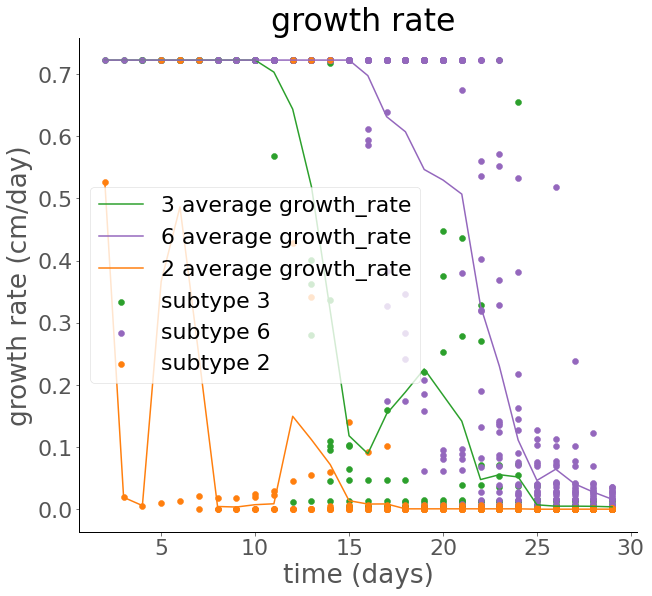

In [156]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler


df = pd.read_csv(name_list[1])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
gr = gr[gr['order']==2]
# plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))


a=2
b=1
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(10,20))

plt.rc('axes', prop_cycle=(cycler('color', [
    '#2ca02c',  # cooked asparagus green
    '#9467bd',  # muted purple
    '#ff7f0e',  # safety orange
    '#1f77b4',  # muted blue
                           
                                            '#d62728',  # brick red
                           
                           
                           
    '#8c564b',  # chestnut brown
    '#e377c2',  # raspberry yogurt pink
    '#7f7f7f',  # middle gray
    '#bcbd22',  # curry yellow-green
    '#17becf'   # blue-teal
                           ])))

ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')

ax1.spines['left'].set_color('black')

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("growth rate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)

ax1.title.set_text(" growth rate")

# column_x = "organ_id2"
column_x = "sub_type"
x = gr.index.unique()
for i in range(0, len(gr[column_x].unique())):
    print(gr[column_x].unique()[i])
    x = gr[gr[column_x] == gr[column_x].unique()[i]].index
    ax1.scatter( x, gr[gr[column_x] ==gr[column_x].unique()[i]]["growth_rate"] ,  label ="subtype {}".format( gr[column_x].unique()[i]),marker= "o")
    ax1.plot( gr[gr['sub_type']==gr[column_x].unique()[i]].groupby(['time'])["growth_rate"].mean() ,
             label = "{} average growth_rate".format( gr[column_x].unique()[i])   )


# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], c = gr["order"], label = "2nd order growth rate" )
# ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , c = gr["order"], linestyle = "--", label = "average growth rate" )

# df = pd.read_csv(name_list[1])
# df = df.set_index("time")
# gr = df[df["growth_rate"].notna()]
# x = gr.index.unique()
# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = "darkgrey", label = "1st order growth rate" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = "lightgrey", label = "2nd order growth rate" )
# ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color = "darkgrey", linestyle = "--", label = "average growth rate" )


# df = pd.read_csv(name_list[2])
# df = df.set_index("time")
# gr = df[df["growth_rate"].notna()]
# x = gr.index.unique()
# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = "red", label = "1st order growth rate" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = "orange", label = "2nd order growth rate" )
# ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color = "red", linestyle = "--", label = "average growth rate" )

ax1.legend()

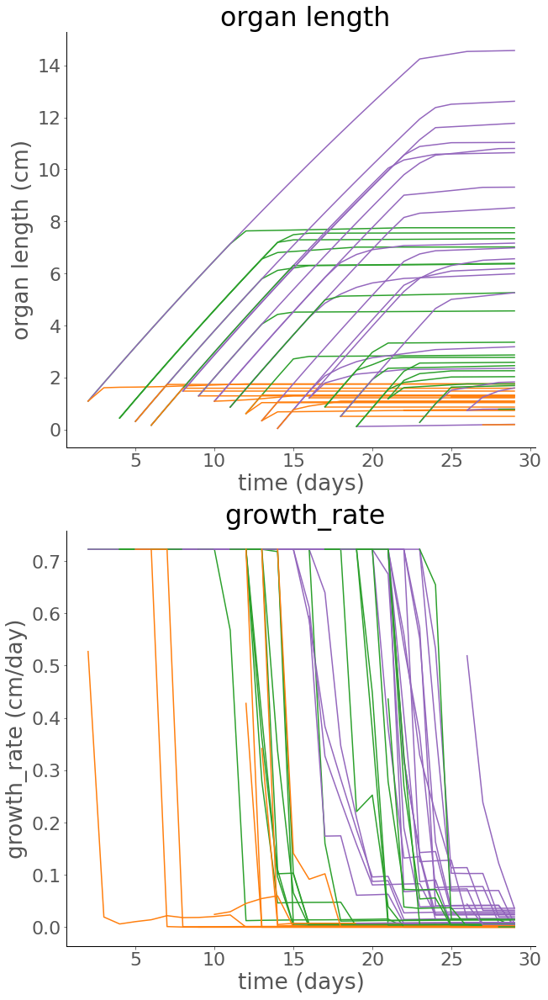

In [204]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler


df = pd.read_csv(name_list[1])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
gr = gr[gr['order']==2]
# plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))



# map1 = map([lambda x: color[x]],  )
a=2
b=1
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(10,20))

color = [
    (1, .498, .055),
    (1, .498, .055),
    (1, .498, .055),
    (0.173,0.627,0.173),  # cooked asparagus green
    (0.58, 0.404, 0.741),  # muted purple
    (0.58, 0.404, 0.741),  # muted purple
    (0.58, 0.404, 0.741),  # muted purple
    (1, .498, .055),  # safety orange
    (1, .498, .055),  # safety orange
]

ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')

ax1.spines['left'].set_color('black')

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("organ length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)

ax1.title.set_text(" organ length")

column_x = "organ_id2"
# column_x = "sub_type"

x = gr.index.unique()
for i in range(0, len(gr[column_x].unique())):
    colors = list(map(lambda x: color[x], gr[gr[column_x] == gr[column_x].unique()[i] ]['sub_type']))
#     print(colors)
    x = gr[gr[column_x] == gr[column_x].unique()[i]].index
    ax1.plot( x, gr[gr[column_x] ==gr[column_x].unique()[i]]["organ_length"] , color=colors[0] ,  label ="subtype {}".format( gr[column_x].unique()[i]))
#     ax1.plot( gr[gr[column_x]==gr[column_x].unique()[i]].groupby(['time'])["organ_length" ].mean() ,
#              label = "{} organ_length".format( gr[column_x].unique()[i])   )


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')

ax1.spines['left'].set_color('black')

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("growth_rate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)

ax1.title.set_text(" growth_rate")

column_x = "organ_id2"
# column_x = "sub_type"

x = gr.index.unique()
for i in range(0, len(gr[column_x].unique())):
    colors = list(map(lambda x: color[x], gr[gr[column_x] == gr[column_x].unique()[i] ]['sub_type']))
#     print(colors)
    x = gr[gr[column_x] == gr[column_x].unique()[i]].index
    ax1.plot( x, gr[gr[column_x] ==gr[column_x].unique()[i]]["growth_rate"] , color=colors[0] ,  label ="subtype {}".format( gr[column_x].unique()[i]))
#     ax1.plot( gr[gr[column_x]==gr[column_x].unique()[i]].groupby(['time'])["organ_length" ].mean() ,
#              label = "{} organ_length".format( gr[column_x].unique()[i])   )


In [181]:
colors

[(0.58, 0.404, 0.741), (0.58, 0.404, 0.741)]

IndexError: tuple index out of range

In [140]:

for i in range(0, len(gr[column_x].unique())):
    print(gr[column_x].unique()[i])
    print(gr[gr[column_x] == gr[column_x].unique()[i] ]['sub_type'])

5
time
2     3
3     3
4     3
5     3
6     3
7     3
8     3
9     3
10    3
11    3
12    3
13    3
14    3
15    3
16    3
17    3
18    3
19    3
20    3
21    3
22    3
23    3
24    3
25    3
26    3
27    3
28    3
29    3
Name: sub_type, dtype: int64
6
time
2     6
3     6
4     6
5     6
6     6
7     6
8     6
9     6
10    6
11    6
12    6
13    6
14    6
15    6
16    6
17    6
18    6
19    6
20    6
21    6
22    6
23    6
24    6
25    6
26    6
27    6
28    6
29    6
Name: sub_type, dtype: int64
7
time
2     2
3     2
4     2
5     2
6     2
7     2
8     2
9     2
10    2
11    2
12    2
13    2
14    2
15    2
16    2
17    2
18    2
19    2
20    2
21    2
22    2
23    2
24    2
25    2
26    2
27    2
28    2
29    2
Name: sub_type, dtype: int64
10
time
4     3
5     3
6     3
7     3
8     3
9     3
10    3
11    3
12    3
13    3
14    3
15    3
16    3
17    3
18    3
19    3
20    3
21    3
22    3
23    3
24    3
25    3
26    3
27    3
28    3
29    3
Name

In [56]:
ax1.violinplot(gr)

TypeError: cannot perform reduce with flexible type

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:47: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:64: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:65: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:66: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning:



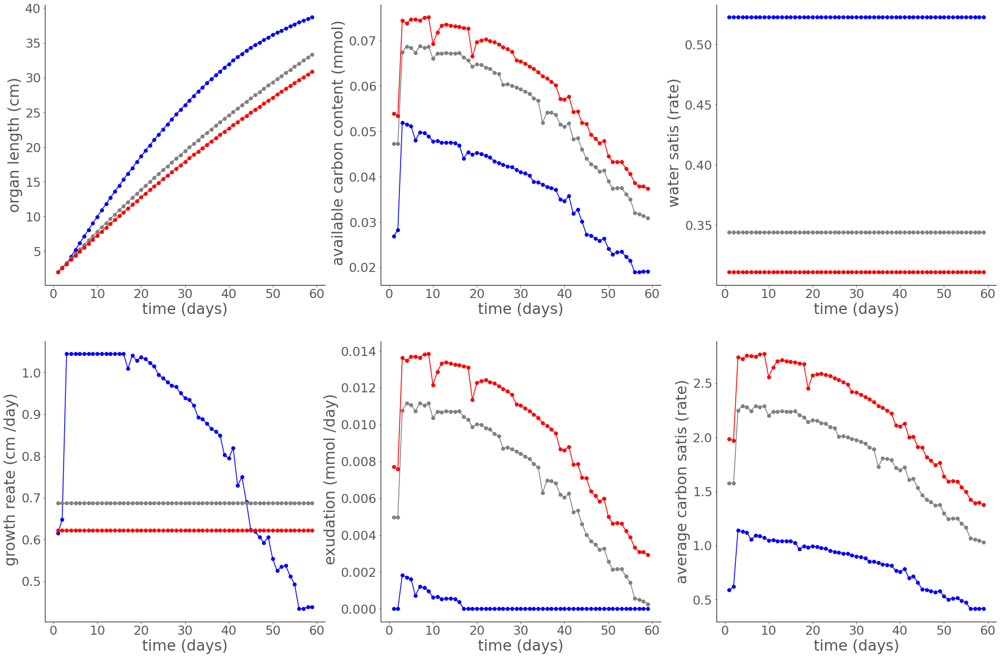

In [38]:
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["blue", "lightblue", "blue"]
a=2
b=3

# aa = -0.1
# bb = -0.8
# cc = -1.5

aa = -0.7
bb = -1.3
cc = -1.5


plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))


# wp1, wp2, wp3 = 1.5, 0.8, 0.1
wp1, wp2, wp3 = 1.5, 1.3, 0.7

# name_list = ["small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
name_list = ["small_2020_abs.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]

name_list2 = ["small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]


df = pd.read_csv(name_list2[0])


ax1 = fig.add_subplot(a, b, 1)

order = 1
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("organ length (cm)")
col = "organ_length"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "red")


ax1 = fig.add_subplot(a, b, 2)



ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel(" available carbon content (mmol)")
col = "carbon_q"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).sum(),marker= "o", color = "red")

ax1 = fig.add_subplot(a, b, 3)


# df = df.set_index("time")

ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel(" water satis (rate)")
col = "rw_satis"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "red")


ax1 = fig.add_subplot(a, b, 4)


# df = df.set_index("time")

ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel(" growth reate (cm /day)")
col = "growth_rate"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "red")

ax1 = fig.add_subplot(a, b, 5)


# df = df.set_index("time")

ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel(" exudation (mmol /day)")
col = "exudation"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "red")

ax1 = fig.add_subplot(a, b, 6)


# df = df.set_index("time")

ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average carbon satis (rate)")
col = "c_satis"
ax1.plot(df[df["root_water"] == aa][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "blue")
ax1.plot(df[df["root_water"] == bb][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "grey")
ax1.plot(df[df["root_water"] == cc][df["order"] == order][[col,"time"]].groupby(['time']).mean(),marker= "o", color = "red")

In [40]:
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

In [102]:
water_p_list2 = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_more_lateral.xml"
time_total = 30
name_list2 = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list2.append("{}.csv".format(output_name))

In [1]:
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_abs.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

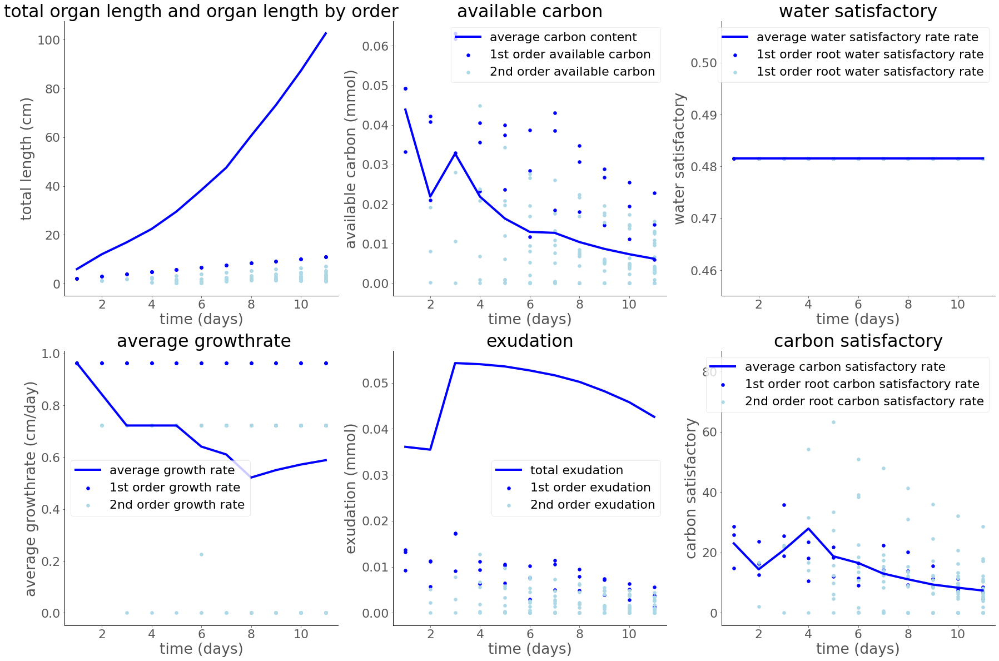

In [46]:



import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list[1])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["blue", "lightblue", "blue"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length and organ length by order")
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )

# df = pd.read_csv(name_list[1])
# df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# gr = df[df["growth_rate"].notna()] 

# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["carbon_q"], color = color_list[0], label = "1st order available carbon" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["carbon_q"], color = color_list[1], label = "2nd order available carbon" )
ax1.plot( x, gr.groupby(gr.index)["carbon_q"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon content" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["exudation"], color = color_list[0], label = "1st order exudation" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["exudation"], color = color_list[1], label = "2nd order exudation" )
ax1.plot( x, gr.groupby(gr.index)["exudation"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total exudation" )
ax1.legend()





ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = color_list[0], label = "1st order growth rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = color_list[1], label = "2nd order growth rate" )
ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color =color_list[2], linestyle = "-", label = "average growth rate" )
ax1.legend()




ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["rw_satis"], color = color_list[0], label = "1st order root water satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["rw_satis"], color = color_list[1], label = "1st order root water satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["rw_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average water satisfactory rate rate" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["c_satis"], color = color_list[0], label = "1st order root carbon satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["c_satis"], color = color_list[1], label = "2nd order root carbon satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["c_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon satisfactory rate" )
ax1.legend()

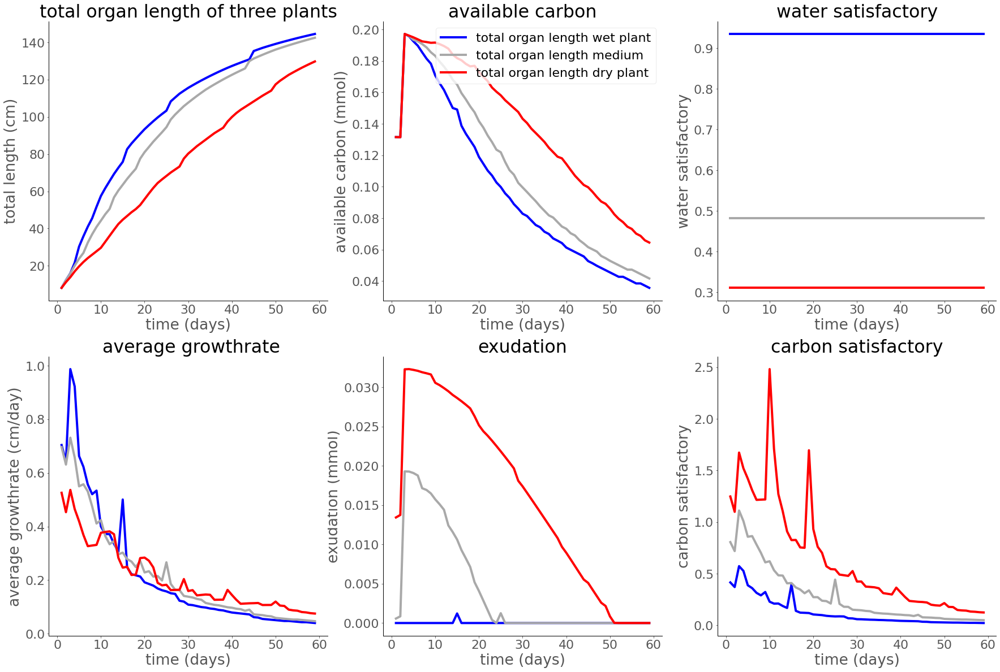

In [42]:
# compare 3 different plant
water_p_list = [[0.1, 0.1, 0.1], [0.8, 0.8, 0.8], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["blue", "darkgrey", "red"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length of three plants")

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "organ_length"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
# ax1.legend()



ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "carbon_q"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length wet plant" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length medium" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length dry plant" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "exudation"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
# ax1.legend()







ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "growth_rate"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
# ax1.legend()





ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "rw_satis"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
# ax1.legend()



ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "c_satis"
df = pd.read_csv(name_list[0])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list[2])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
# ax1.legend()


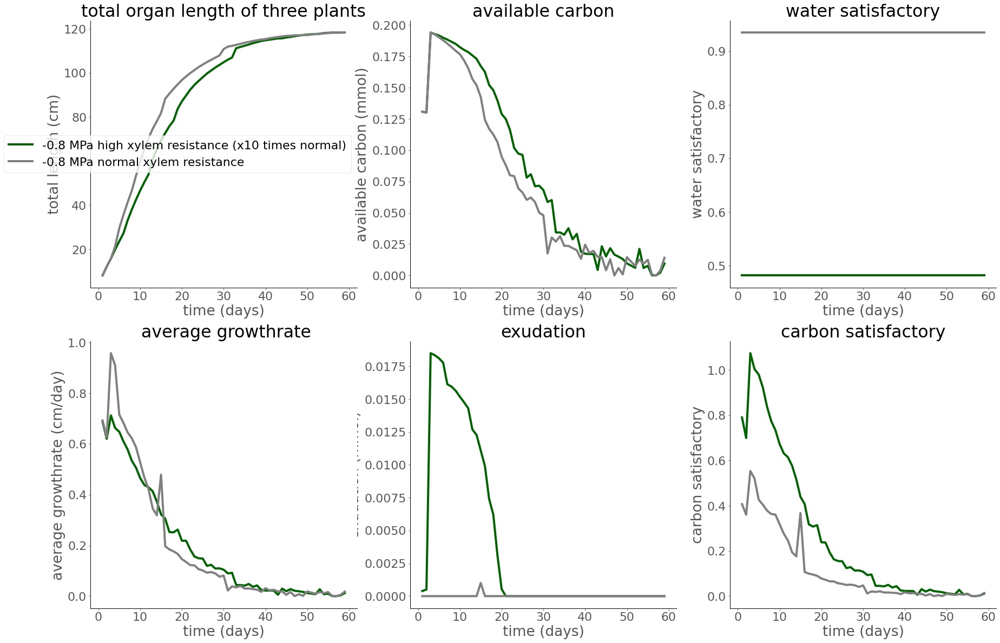

In [1]:
# compare 3 different plant
name_list2 = ["small_2020_abs.xml_60_0.1_0.1_0.1.csv", "small_2020_abs.xml_60_0.1_0.1_0.1.csv"]
name_list = ["small_2020_abs.xml_60_0.8_0.8_0.8.csv", "small_2020_abs.xml_60_0.8_0.8_0.8.csv"]

# name_list2 = ["small_2020.xml_60_0.8_0.8_0.8.csv", "small_2020.xml_60_0.8_0.8_0.8.csv"]
# name_list = ["small_2020_high_xyl_x_10.xml_60_0.8_0.8_0.8.csv", "small_2020_high_xyl_x_10.xml_60_0.8_0.8_0.8.csv"]


# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv", "small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv"]


# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_low_st.xml_60_0.1_0.1_0.1.csv", "small_2020_low_st.xml_60_0.1_0.1_0.1.csv"]

# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_more_lateral.xml_30_0.1_0.1_0.1.csv", "small_2020_more_lateral.xml_30_0.1_0.1_0.1.csv"]


# wp1, wp2, wp3 = 1.5, 0.8, 0.1
# name_list = ["small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
# name_list2 = ["small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]


# wp1, wp2, wp3 = 99, 99, 99
# name_list = ["small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
# # name_list2 = ["small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]



import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["darkgreen","grey",  "red"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length of three plants")

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "organ_length"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "-0.8 MPa high xylem resistance (x10 times normal)" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "-0.8 MPa normal xylem resistance" )
# ax1.legend()
ax1.legend()



ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "carbon_q"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length wet plant" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length medium" )
# ax1.legend()




ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "exudation"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()








ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "growth_rate"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()






ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "rw_satis"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()





ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "c_satis"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()small_2020_low_st.xml_60_0.1_0.1_0.1.csv

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()



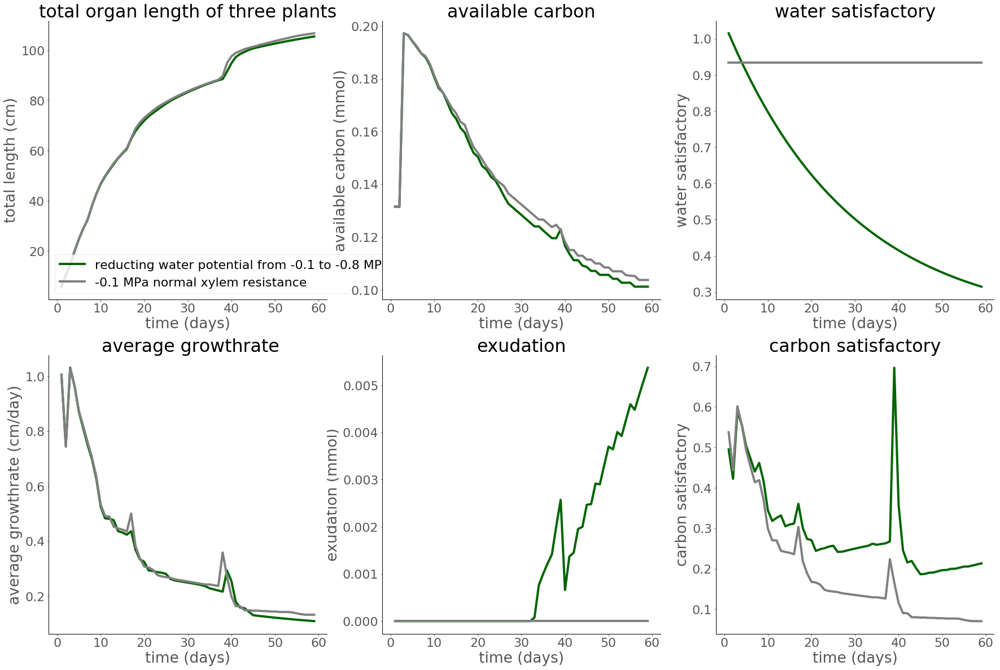

In [8]:
# compare 3 different plant
# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_high_xyl_x_10.xml_60_0.1_0.1_0.1.csv", "small_2020_high_xyl_x_10.xml_60_0.1_0.1_0.1.csv"]

# name_list2 = ["small_2020.xml_60_0.8_0.8_0.8.csv", "small_2020.xml_60_0.8_0.8_0.8.csv"]
# name_list = ["small_2020_high_xyl_x_10.xml_60_0.8_0.8_0.8.csv", "small_2020_high_xyl_x_10.xml_60_0.8_0.8_0.8.csv"]


# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv", "small_2020_low_xyl.xml_60_0.1_0.1_0.1.csv"]


# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_low_st.xml_60_0.1_0.1_0.1.csv", "small_2020_low_st.xml_60_0.1_0.1_0.1.csv"]

# name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]
# name_list = ["small_2020_more_lateral.xml_30_0.1_0.1_0.1.csv", "small_2020_more_lateral.xml_30_0.1_0.1_0.1.csv"]


# wp1, wp2, wp3 = 1.5, 0.8, 0.1
# name_list = ["small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
# name_list2 = ["small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]


wp1, wp2, wp3 = 99, 99, 99
name_list = ["small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020_low_xyl_10.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
# name_list2 = ["small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3), "small_2020.xml_60_{}_{}_{}.csv".format(wp1, wp2, wp3)]
name_list2 = ["small_2020.xml_60_0.1_0.1_0.1.csv", "small_2020.xml_60_0.1_0.1_0.1.csv"]



import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["darkgreen","grey",  "red"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length of three plants")

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "organ_length"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "reducting water potential from -0.1 to -0.8 MPa" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "-0.1 MPa normal xylem resistance" )
# ax1.legend()
ax1.legend()



ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "carbon_q"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length wet plant" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length medium" )
# ax1.legend()




ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()

df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "exudation"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()








ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "growth_rate"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()






ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "rw_satis"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()





ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
df = pd.read_csv(name_list[0])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

# ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
# ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
col= "c_satis"
df = pd.read_csv(name_list[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )
# ax1.legend()small_2020_low_st.xml_60_0.1_0.1_0.1.csv

df = pd.read_csv(name_list2[1])
df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
gr = df[df["growth_rate"].notna()] 
x = gr.index.unique()
ax1.plot( x, gr.groupby(gr.index)[col].mean() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()



In [160]:
water_p_list2 = [[0.1, 0.1, 0.1], [0.1, 0.1, 0.1], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020_low_st.xml"
time_total = 60
name_list2 = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list2.append("{}.csv".format(output_name))

In [110]:
water_p_list = [[0.1, 0.1, 0.1], [0.1, 0.1, 0.1], [1.5, 1.5, 1.5], [1.5, 0.8, 0.1] , 
                [0.3, 0.3, 0.3] , [0.5, 0.5, 0.5] , [0.7, 0.7, 0.7] , [0.9, 0.9, 0.9], 
                [1.1, 1.1, 1.1] , [1.3, 1.3, 1.3] ,[1.5, 1.2, 0.6] , [1.5, 1.3, 0.7] ]
name = "small_2020.xml"
time_total = 60
name_list = []
for i, water_p in enumerate(water_p_list):
    water_dry, water_middle, water_wet =  water_p
    output_name = "{}_{}_{}_{}_{}".format(name, time_total, water_dry, water_middle, water_wet)
    name_list.append("{}.csv".format(output_name))

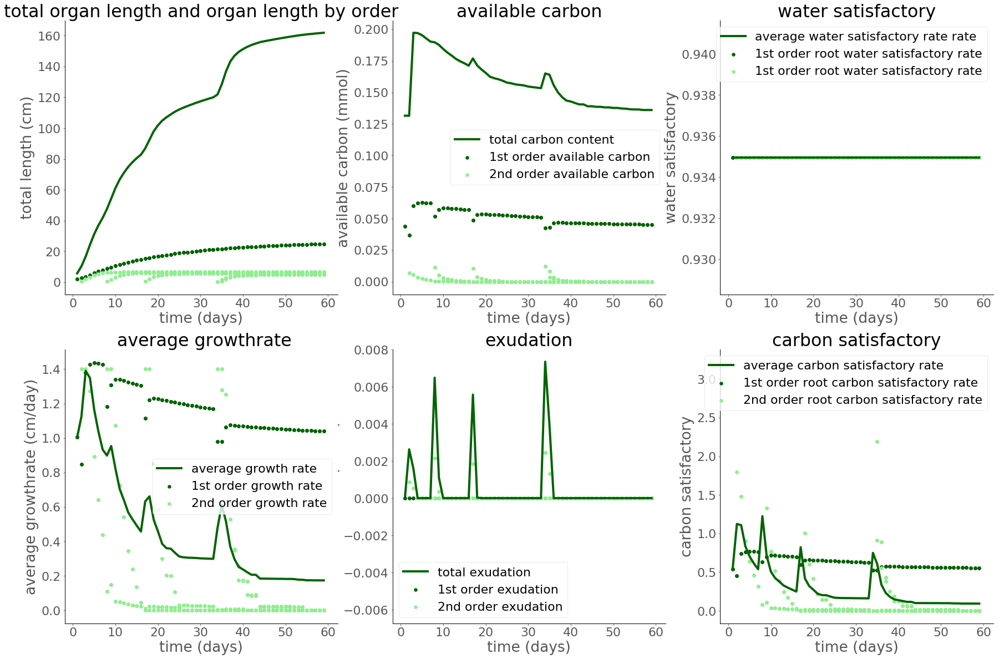

In [168]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv("small_2020_low_st.xml_60_0.1_0.1_0.1.csv")
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['darkgreen', 'lightgreen', 'grey','lightgrey', 'red','orange'])))
color_list = ['darkgreen', 'lightgreen', "darkgreen"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length and organ length by order")
x = gr.index.unique()
# ax1.scatter( gr.index[gr["root_water"] == -0.7], gr[gr["root_water"] == -0.7]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.3], gr[gr["root_water"] == -1.3]["organ_length"], color = color_list[1], label = "2nd order organ length" )
# ax1.scatter( gr.index[gr["root_water"] == -1.5], gr[gr["root_water"] == -1.5]["organ_length"], color = color_list[2], label = "2nd order organ length" )

ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )


# ax1.scatter( gr.index, gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[0], linestyle = "-", label = "total organ length" )

# df = pd.read_csv(name_list[1])
# df = df.set_index("time")
# # ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "total available carbon" )
# gr = df[df["growth_rate"].notna()] 

# ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[1], linestyle = "-", label = "total organ length" )
# ax1.legend()


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["carbon_q"], color = color_list[0], label = "1st order available carbon" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["carbon_q"], color = color_list[1], label = "2nd order available carbon" )
ax1.plot( x, gr.groupby(gr.index)["carbon_q"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total carbon content" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["exudation"], color = color_list[0], label = "1st order exudation" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["exudation"], color = color_list[1], label = "2nd order exudation" )
ax1.plot( x, gr.groupby(gr.index)["exudation"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total exudation" )
ax1.legend()





ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = color_list[0], label = "1st order growth rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = color_list[1], label = "2nd order growth rate" )
ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color =color_list[2], linestyle = "-", label = "average growth rate" )
ax1.legend()




ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["rw_satis"], color = color_list[0], label = "1st order root water satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["rw_satis"], color = color_list[1], label = "1st order root water satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["rw_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average water satisfactory rate rate" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["c_satis"], color = color_list[0], label = "1st order root carbon satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["c_satis"], color = color_list[1], label = "2nd order root carbon satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["c_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon satisfactory rate" )
ax1.legend()

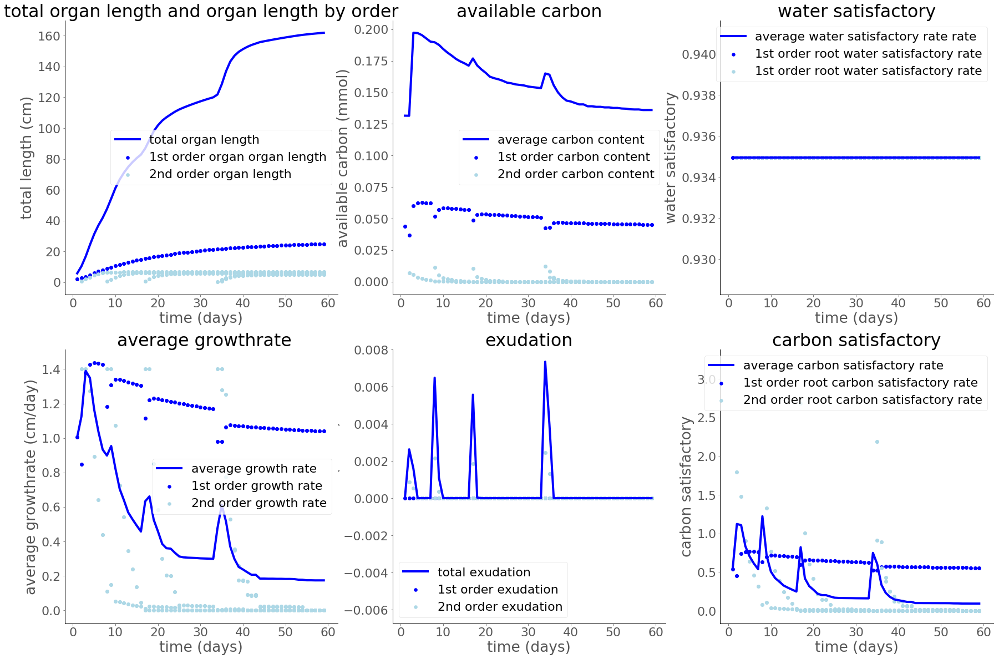

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv("small_2020_low_st.xml_60_0.1_0.1_0.1.csv")
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["blue", "lightblue", "blue"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length and organ length by order")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["carbon_q"], color = color_list[0], label = "1st order carbon content" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["carbon_q"], color = color_list[1], label = "2nd order carbon content" )
ax1.plot( x, gr.groupby(gr.index)["carbon_q"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon content" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["exudation"], color = color_list[0], label = "1st order exudation" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["exudation"], color = color_list[1], label = "2nd order exudation" )
ax1.plot( x, gr.groupby(gr.index)["exudation"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total exudation" )
ax1.legend()





ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = color_list[0], label = "1st order growth rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = color_list[1], label = "2nd order growth rate" )
ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color =color_list[2], linestyle = "-", label = "average growth rate" )
ax1.legend()




ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["rw_satis"], color = color_list[0], label = "1st order root water satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["rw_satis"], color = color_list[1], label = "1st order root water satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["rw_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average water satisfactory rate rate" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["c_satis"], color = color_list[0], label = "1st order root carbon satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["c_satis"], color = color_list[1], label = "2nd order root carbon satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["c_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon satisfactory rate" )
ax1.legend()

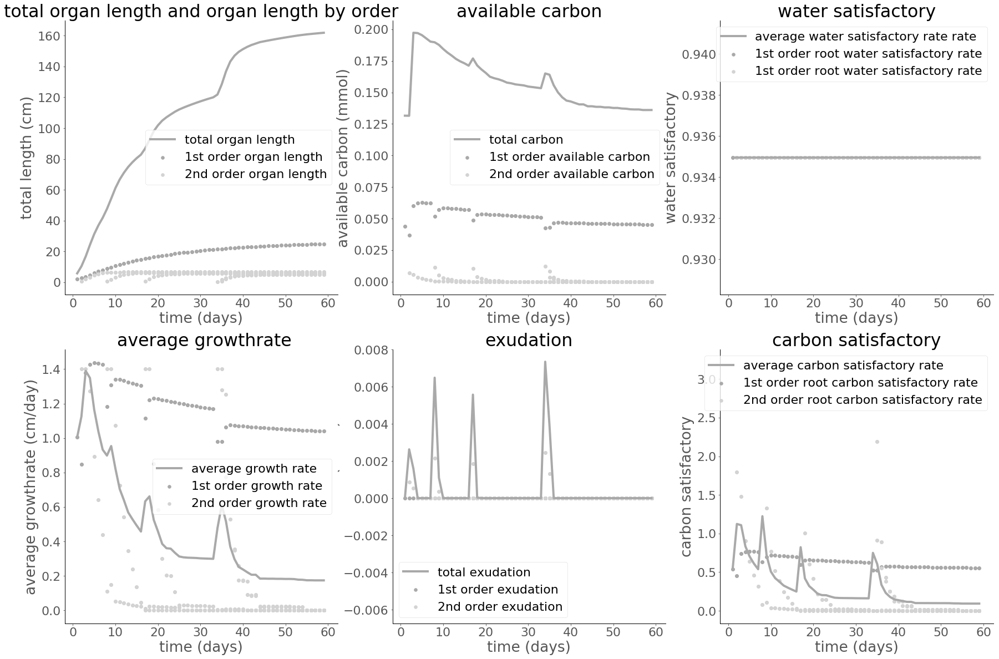

In [113]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list2[1])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["darkgrey", "lightgrey", "darkgrey"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length and organ length by order")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ length" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["carbon_q"], color = color_list[0], label = "1st order available carbon" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["carbon_q"], color = color_list[1], label = "2nd order available carbon" )
ax1.plot( x, gr.groupby(gr.index)["carbon_q"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total carbon" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["exudation"], color = color_list[0], label = "1st order exudation" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["exudation"], color = color_list[1], label = "2nd order exudation" )
ax1.plot( x, gr.groupby(gr.index)["exudation"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total exudation" )
ax1.legend()





ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = color_list[0], label = "1st order growth rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = color_list[1], label = "2nd order growth rate" )
ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color =color_list[2], linestyle = "-", label = "average growth rate" )
ax1.legend()




ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["rw_satis"], color = color_list[0], label = "1st order root water satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["rw_satis"], color = color_list[1], label = "1st order root water satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["rw_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average water satisfactory rate rate" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["c_satis"], color = color_list[0], label = "1st order root carbon satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["c_satis"], color = color_list[1], label = "2nd order root carbon satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["c_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon satisfactory rate" )
ax1.legend()

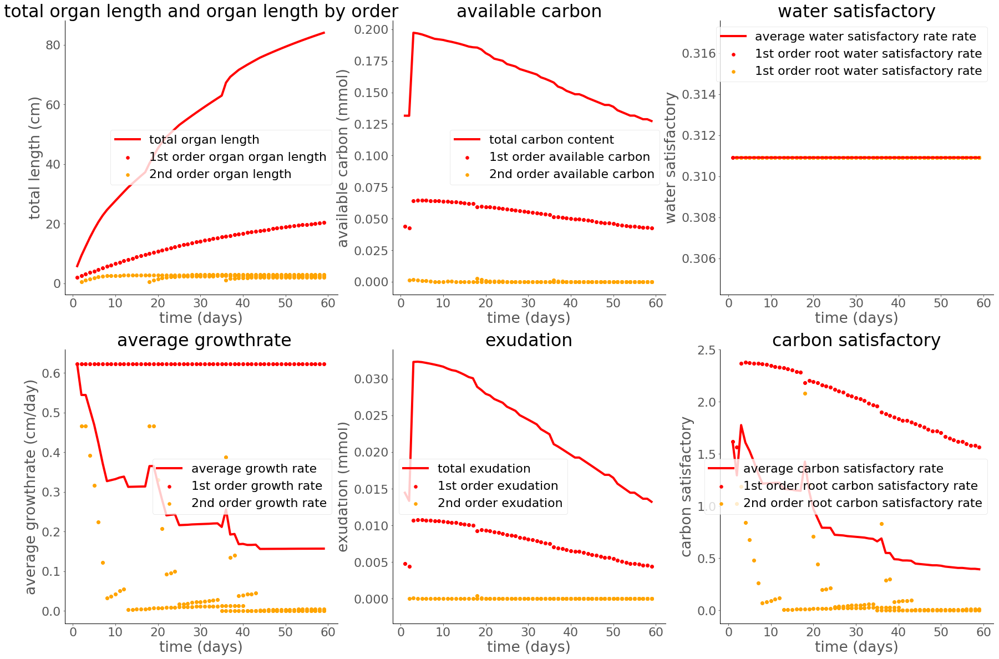

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
from cycler import cycler
df = pd.read_csv(name_list[2])
df = df.set_index("time")
gr = df[df["growth_rate"].notna()] 
plt.rc('axes', prop_cycle=(cycler('color', ['blue', 'lightblue', 'grey','lightgrey', 'red','orange'])))
color_list = ["red", "orange", "red"]
a=2
b=3
plt.style.use('ggplot')
plt.rcParams['axes.facecolor']='w'
plt.rcParams.update({'font.size': 22})

fig = plt.figure(figsize=(30,20))



ax1 = fig.add_subplot(a, b, 1)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("total length (cm)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("total organ length and organ length by order")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["organ_length"], color = color_list[0], label = "1st order organ organ length" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["organ_length"], color = color_list[1], label = "2nd order organ length" )
ax1.plot( x, gr.groupby(gr.index)["organ_length"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total organ length" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 2)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("available carbon (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("available carbon")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["carbon_q"], color = color_list[0], label = "1st order available carbon " )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["carbon_q"], color = color_list[1], label = "2nd order available carbon" )
ax1.plot( x, gr.groupby(gr.index)["carbon_q"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total carbon content" )
ax1.legend()



ax1 = fig.add_subplot(a, b, 5)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("exudation (mmol)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("exudation")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["exudation"], color = color_list[0], label = "1st order exudation" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["exudation"], color = color_list[1], label = "2nd order exudation" )
ax1.plot( x, gr.groupby(gr.index)["exudation"].sum() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "total exudation" )
ax1.legend()





ax1 = fig.add_subplot(a, b, 4)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("average growthrate (cm/day)")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text(" average growthrate")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["growth_rate"], color = color_list[0], label = "1st order growth rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["growth_rate"], color = color_list[1], label = "2nd order growth rate" )
ax1.plot( x, gr.groupby(gr.index)["growth_rate"].mean() , linewidth = 4 , color =color_list[2], linestyle = "-", label = "average growth rate" )
ax1.legend()




ax1 = fig.add_subplot(a, b, 3)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("water satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("water satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["rw_satis"], color = color_list[0], label = "1st order root water satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["rw_satis"], color = color_list[1], label = "1st order root water satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["rw_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average water satisfactory rate rate" )
ax1.legend()


ax1 = fig.add_subplot(a, b, 6)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("time (days)")
ax1.set_ylabel("carbon satisfactory")
# ax1.set_xticks(list(ax1.set_xticks()[0]) + extraticks)
# days = range(1,len(root_he_c3 )+1)
#ax1.plot(days,f(np.array(root_1_c_cf)), marker = "o", linestyle="-", color = "blue", label= "Water potential -0.1 MPa ", zorder=99)
#ax1.plot(days,f(np.array(root_2_c_cf)), marker = "o", linestyle="-", color = "yellow", label= "Water potential -0.3 MPa ", zorder=99)
ax1.title.set_text("carbon satisfactory")
x = gr.index.unique()
ax1.scatter( gr.index[gr["order"] == 1], gr[gr["order"] == 1]["c_satis"], color = color_list[0], label = "1st order root carbon satisfactory rate" )
ax1.scatter( gr.index[gr["order"] == 2], gr[gr["order"] == 2]["c_satis"], color = color_list[1], label = "2nd order root carbon satisfactory rate" )
ax1.plot( x, gr.groupby(gr.index)["c_satis"].mean() , linewidth = 4 , color = color_list[2], linestyle = "-", label = "average carbon satisfactory rate" )
ax1.legend()

In [12]:
def read_filter(file_name):
    op_01 = pd.read_csv(file_name)
    gr_column = ["time", "order", "growth_rate"]
    op_01_gr = op_01[op_01["growth_rate"].notna()]
    op_01_gr =  op_01_gr[gr_column]


    ca_column = ["time", "order", "carbon_q"]
    op_01_ca = op_01[op_01["growth_rate"].notna()]
    op_01_ca =  op_01_ca[ca_column]

    len_column = ["time", "order", "organ_length"]
    op_01_len = op_01[op_01["growth_rate"].notna()]
    op_01_len =  op_01_len[len_column]
    
    len_column = ["time", "order", "exudation"]
    op_01_ex = op_01[op_01["growth_rate"].notna()]
    op_01_ex =  op_01_ex[len_column]
    
    len_column = ["time", "order", "rw_satis", "organ_id", "organ_id2"]
    op_01_ws = op_01[op_01["growth_rate"].notna()]
    op_01_ws =  op_01_ws[len_column]
    
# , "organ_id2", "id", "organ_type", "connection_1","connection_2"
    len_column = ["time", "order", "c_satis", "organ_id",  "organ_id2"]
    op_01_cs = op_01[op_01["growth_rate"].notna()]
    op_01_cs =  op_01_cs[len_column]
    
    
    df = {"growth_rate": op_01_gr, "carbon": op_01_ca, "length": op_01_len, 
          "exudation":op_01_ex ,"rw_satis":op_01_ws, "c_satis":op_01_cs }
    return df



In [13]:
from plotly.subplots import make_subplots
from itertools import cycle

all_trace = []
all_name = ["1st order wet root", "2st order wet root",
            "1st order medium root","2st order medium root",
            "1st order dry root","2st order dry root",
           "1st order wet root", "2st order wet root",
            "1st order medium root","2st order medium root",
            "1st order dry root","2st order dry root",
           "1st order wet root", "2st order wet root",
            "1st order medium root","2st order medium root",
            "1st order dry root","2st order dry root",
           "1st order wet root", "2st order wet root",
            "1st order medium root","2st order medium root",
            "1st order dry root","2st order dry root",]
for j,name in enumerate(name_list[0:1]):
    df = read_filter(name)
    df = df["rw_satis"]
    all_trace.append(df[df["order"] == 1])
    all_trace.append(df[df["order"] == 2])
for j,name in enumerate(name_list[0:1]):
    df = read_filter(name)
    df = df["rw_satis"]
    all_trace.append(df[df["order"] == 1])
    all_trace.append(df[df["order"] == 2])
    
    
for j,name in enumerate(name_list[0:1]):
    df = read_filter(name)
    df = df["c_satis"]
    all_trace.append(df[df["order"] == 1])
    all_trace.append(df[df["order"] == 2])
    
for j,name in enumerate(name_list[0:1]):
    df = read_filter(name)
    df = df["c_satis"]
    all_trace.append(df[df["order"] == 1])
    all_trace.append(df[df["order"] == 2])
fig =  make_subplots(rows=2, cols=2,
                    specs=[[{'is_3d': True},{'is_3d': True} ], [{'is_3d': True}, {'is_3d': True}]],
                    print_grid=False, subplot_titles=["water satisfactory rate getOrgan", 
                                                      
                                                      "carbon satisfactory rate getOrgan",
                                                       "water satisfactory rate organId",
                                                       "carbon satisfactory rate organId"],
                    horizontal_spacing = 0.1,
                     vertical_spacing = 0.1,
                    
                    )
column_list = ["rw_satis","rw_satis","rw_satis","rw_satis","rw_satis","rw_satis",              
               "rw_satis","rw_satis","rw_satis","rw_satis","rw_satis","rw_satis",
                "c_satis","c_satis","c_satis","c_satis" , "c_satis","c_satis","c_satis","c_satis" ,
               "c_satis","c_satis","c_satis","c_satis", "c_satis","c_satis","c_satis","c_satis" ]  
order_list = [1,2,1,2,1,2,
              1,2,1,2,1,2,
              1,2,1,2,1,2,
              1,2,1,2,1,2
             ]

f_row = [1,1,1,1,1,1,
        2,2,2,2,2,2,
        1,1,1,1,1,1,
        2,2,2,2,2,2]
f_column = [1,1,1,1,1,1,
            1,1,1,1,1,1,
            2,2,2,2,2,2, 
            2,2,2,2,2,2,]

organ_name = ["organ_id","organ_id","organ_id","organ_id","organ_id","organ_id",
             "organ_id2","organ_id2","organ_id2","organ_id2","organ_id2","organ_id2",
             "organ_id","organ_id","organ_id","organ_id","organ_id","organ_id",
             "organ_id2","organ_id2","organ_id2","organ_id2","organ_id2","organ_id2",]

color_name = ["blue" ,"lightblue","darkgrey","lightgrey","red","orange",
             "blue" ,"lightblue","darkgrey","lightgrey","red","orange",
              "blue" ,"lightblue","darkgrey","lightgrey","red","orange",
              "blue" ,"lightblue","darkgrey","lightgrey","red","orange",
            
             ]

for j,df in enumerate(all_trace):

#     k = [{"1":"#1f77b4", "2":"#419ede" }, {"1":"#1c2f2f", "2":"#4c7f7f" }, {"1" : "#73141d", "2" : "#de4150"}]
   



    fig.add_trace(
        go.Scatter3d(
            x=df["time"],
            y=df[organ_name[j]],
            z=df[column_list[j]],
#             mode='lines+markers',
            mode='markers',
#             line={"color":cm[df["rw_satis"]], "width" : 8},
            marker=dict(
            color= color_name[j],
            size=2,
            line=dict(
                color=color_name[j],
                width=1)
        ),
            name=all_name[j]
            
     
    ),
           row=f_row[j], col=f_column[j]
    )
        


        
# fig.update_layout(title = 'Locales', width=1950, height=750, plot_bgcolor='rgb(255,255,255)')

scence = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(250, 250, 250)",
                         gridcolor="lightgrey",
                         showbackground=True,
                         zerolinecolor="black",),
                    yaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black"),
                    zaxis = dict(
                        backgroundcolor="rgb(250, 250,250)",
                        gridcolor="lightgrey",
                        showbackground=True,
                        zerolinecolor="black",),)
# fig.update_layout(scene = scence,
#                     width=700,
#                     margin=dict(
#                     r=10, l=10,
#                     b=10, t=10)
#                   )

# fig.update_layout(scene2 = scence,
#                     width=700,
#                     margin=dict(
#                     r=10, l=10,
#                     b=10, t=10)
#                   )


# fig.update_layout(scene3 = scence,
#                     width=1800,
#                     margin=dict(
#                     r=10, l=10,
#                     b=10, t=10)
#                   )


# camera = dict(
# eye=dict(x=0, y=2, z=0.1))
    

# fig.update_layout(scene_camera=camera)
# fig.update_layout(scene2_camera=camera)
# fig.update_layout(scene3_camera=camera)

fig.update_layout(autosize=True, 
                  legend = {"font" : dict( size= 10 ), "itemsizing" : "constant",},
                  scene = dict(
                    xaxis_title='Time ',
                    yaxis_title='Organ Id',
                    zaxis_title=' Water Satisfactory Ratio'),
                    width=1000,
                    height = 750,

                    margin=dict(r=5, b=5, l=5, t=40), title_text= "plant structure by order")


fig.show()

KeyError: 'rw_satis'

In [32]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("small_2020_abs.xml_60_0.1_0.1_0.1.csv")
c1 = df[df["time"] == 59]["connection_1"].tolist()
c2 = df[df["time"] == 59]["connection_1"].tolist()
cx = df[df["time"] == 59]["coor_x"].tolist()
cy = df[df["time"] == 59]["coor_y"].tolist()
cz= df[df["time"] == 59]["coor_z"].tolist()
cst= df[df["time"] == 59]["r_st"].tolist()
cxyl= df[df["time"] == 59]["r_xyl"].tolist()
cc= df[df["time"] == 59]["connect_no"].tolist()

cxyl1 = map(lambda x: x/10, cxyl)

con_x = []
con_y = []
con_z = []
ccc = []
for i in range(0, len(c1)-1):
    con_x.append( (cx[int(c1[i]-1)] + cx[int(c2[i]-1)] )/2    )
    con_y.append( (cy[int(c1[i]-1)] + cy[int(c2[i]-1)] )/2    )
    con_z.append( (cz[int(c1[i]-1)] + cz[int(c2[i]-1)] )/2    )
    ccc.append(cc[int(c1[i]-1)])
df2 = pd.DataFrame(list(zip(con_x, con_y,con_z, cst, cxyl1, ccc)), 
               columns =['con_x', 'con_y','con_z', 'cst', 'cxyl1','ccc']) 
    
px.scatter_3d(df2, x="con_x", y="con_y", z = "con_z" ,
           size="ccc", color="cxyl1",  
           log_x=False)

In [84]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("small_2020_abs.xml_60_0.1_0.1_0.1.csv")

# df= pd.read_csv("small_2020.xml_60_1.5_1.2_0.6.csv")
output_name = 'small_2020_abs.xml_60_0.1_0.1_0.1'
node_connection =  df[df['time'] == 59]["connection_1"].tolist()
piaf_output = read_output(output_name,  node_connection)
df_59 =df[df["time"] == 59]


df_59["p_xyl"] = piaf_output['P_Xyl'][-1][:len(node_connection)].astype(float)


fig = px.scatter_3d(df_59, x="coor_x", y="coor_y", z = "coor_z" ,animation_frame="time", animation_group="order",
           size="connect_no", color="p_xyl", hover_name="id", 
           log_x=False)
plotly.offline.plot(fig, filename='id_offline.html')
fig.show()

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [75]:
df_59 

,time,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,...,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2,r_xyl,r_st,p_xyl
12687,29,1,2,1,4,0,0,0,0.000000,0.000000,...,1,NaN,0.000000,0.000000,-0.020000,1.0,2.0,0.000436,0.04,-0.100002
12688,29,2,2,1,2,0,1,0,0.002500,0.000035,...,1,NaN,-0.000228,-0.002031,-0.021440,2.0,3.0,0.000455,0.04,-0.100000
12689,29,3,2,1,2,0,1,0,0.005000,0.000035,...,1,NaN,-0.000338,-0.004065,-0.022889,3.0,4.0,0.000476,0.04,-0.100000
12690,29,4,2,1,2,0,1,0,0.007500,0.000035,...,1,NaN,-0.000646,-0.006294,-0.023978,4.0,5.0,0.000499,0.04,-0.100000
12691,29,5,2,1,3,0,1,0,0.010000,0.000035,...,1,NaN,-0.001089,-0.008447,-0.025170,5.0,6.0,0.000524,0.04,-0.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13348,29,662,2,4,2,17,2,0,0.202500,0.000035,...,1,NaN,-0.143318,-0.050282,-0.105802,129.0,128.0,0.003597,0.04,-0.100000
13349,29,663,2,4,2,34,3,0,0.202500,0.000035,...,1,NaN,-0.032606,-0.007589,-0.206018,191.0,129.0,0.003214,0.04,-0.100000
13350,29,664,2,1,1,0,1,0,0.202776,0.000035,...,1,20.277579,-0.015438,-0.087601,-0.191134,192.0,191.0,0.002979,0.04,-0.100000
13351,29,665,2,4,1,17,2,0,0.202776,0.000035,...,1,20.277579,-0.143331,-0.050267,-0.106077,236.0,192.0,0.002978,0.04,-0.100000


In [85]:
import plotly.express as px
import pandas as pd

df =pd.read_csv("small_2020_more_lateral.xml_30_0.8_0.8_0.8.csv")

output_name = 'small_2020_more_lateral.xml_30_0.8_0.8_0.8'
node_connection =  df[df['time'] == 29]["connection_1"].tolist()
piaf_output = read_output(output_name,  node_connection)
df_29 =df[df["time"] == 29]
# df= pd.read_csv("small_2020.xml_60_1.5_1.2_0.6.csv")
df_29["p_xyl"] = piaf_output['P_Xyl'][-1][:len(node_connection)].astype(float)


fig = px.scatter_3d(df_29, x="coor_x", y="coor_y", z = "coor_z" ,animation_frame="time", animation_group="order",
           size="connect_no", color="p_xyl", hover_name="id", 
           log_x=False)
plotly.offline.plot(fig, filename='id_offline.html')
fig.show()

/home/zxrzxr/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
df_29

,time,id,organ_type,sub_type,connect_no,organ_id,organ_id2,parent_organ,length,res_main,...,growth_rate,exudation,order,organ_length,coor_x,coor_y,coor_z,connection_1,connection_2,p_xyl
14013,29,1,2,1,4,0,0,0,0.000000,0.000000,...,NaN,NaN,1,NaN,0.000000,0.000000,-0.020000,1.0,2.0,-0.162057
14014,29,2,2,1,2,0,1,0,0.002500,0.000035,...,NaN,NaN,1,NaN,-0.001777,-0.001140,-0.021339,2.0,3.0,-0.159866
14015,29,3,2,1,2,0,1,0,0.005000,0.000035,...,NaN,NaN,1,NaN,-0.003561,-0.002368,-0.022587,3.0,4.0,-0.157614
14016,29,4,2,1,2,0,1,0,0.007500,0.000035,...,NaN,NaN,1,NaN,-0.005422,-0.003479,-0.023833,4.0,5.0,-0.155299
14017,29,5,2,1,3,0,1,0,0.010000,0.000035,...,NaN,NaN,1,NaN,-0.007090,-0.004749,-0.025196,5.0,6.0,-0.152916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14809,29,797,2,1,1,0,1,0,0.238723,0.000035,...,0.505051,0.0,1,23.872306,-0.056632,0.021510,-0.233280,117.0,116.0,-0.100000
14810,29,798,2,4,2,18,2,0,0.237500,0.000035,...,NaN,NaN,1,NaN,-0.031386,0.048287,-0.236635,173.0,117.0,-0.101532
14811,29,799,2,4,1,18,2,0,0.238723,0.000035,...,0.505051,0.0,1,23.872306,-0.031545,0.048321,-0.237847,174.0,173.0,-0.100000
14812,29,800,2,4,2,36,3,0,0.237500,0.000035,...,NaN,NaN,1,NaN,0.000265,0.058859,-0.223250,242.0,174.0,-0.101532


In [29]:
output_name = 'small_2020_abs.xml_60_0.1_0.1_0.1'
node_connection =  df[df['time'] == 59]["connection_1"].tolist()
piaf_output = read_output(output_name,  node_connection)

In [45]:
piaf_output.values()

dict_values([array([ 0.      ,  0.166667,  0.333334,  0.500001,  0.666668,  0.833335,
        1.      ,  1.16667 ,  1.33334 ,  1.5     ,  1.66667 ,  1.83334 ,
        2.      ,  2.16667 ,  2.33334 ,  2.5     ,  2.66667 ,  2.83334 ,
        3.00001 ,  3.16667 ,  3.33334 ,  3.50001 ,  3.66667 ,  3.83334 ,
        4.00001 ,  4.16667 ,  4.33334 ,  4.50001 ,  4.66668 ,  4.83334 ,
        5.00001 ,  5.16668 ,  5.33334 ,  5.50001 ,  5.66668 ,  5.83334 ,
        6.00001 ,  6.16668 ,  6.33335 ,  6.50001 ,  6.66668 ,  6.83335 ,
        7.00001 ,  7.16668 ,  7.33335 ,  7.50001 ,  7.66668 ,  7.83335 ,
        8.00002 ,  8.16668 ,  8.33335 ,  8.50002 ,  8.66668 ,  8.83335 ,
        9.00002 ,  9.16668 ,  9.33335 ,  9.50002 ,  9.66669 ,  9.83335 ,
       10.      , 10.1667  , 10.3334  ]), array([[ 3.02125e-01,  1.51497e-01,  7.59482e-02, ..., -2.77254e-11,
         1.00897e-11,  2.43990e-05],
       [ 2.97969e-01,  1.48787e-01,  7.45579e-02, ...,  6.19502e-04,
         6.19502e-04,  2.41274e-05],
   

In [54]:
len(piaf_output["JW_ST"][-1])

699

In [49]:
for i, content in enumerate( piaf_output.values() ):
    print(content)

TypeError: 'dict_values' object is not subscriptable

In [55]:
piaf_output['JW_ST'][-1]

array([ 8.58438e-01,  8.67479e-01,  8.75486e-01,  8.83761e-01,
        8.53988e-01,  8.61618e-01,  8.69508e-01,  8.77693e-01,
        8.47681e-01,  8.55208e-01,  8.63004e-01,  8.71108e-01,
        8.40895e-01,  8.48326e-01,  8.56037e-01,  8.64069e-01,
        8.33690e-01,  8.41031e-01,  8.48663e-01,  8.56631e-01,
        8.26121e-01,  8.33376e-01,  8.40932e-01,  8.48841e-01,
        8.18235e-01,  8.25406e-01,  8.32890e-01,  8.40744e-01,
        8.10077e-01,  8.17163e-01,  8.24574e-01,  8.32375e-01,
        8.01685e-01,  8.08682e-01,  8.16017e-01,  8.23765e-01,
        7.93096e-01,  7.99997e-01,  8.07251e-01,  8.14941e-01,
        7.84343e-01,  7.91138e-01,  7.98299e-01,  8.05923e-01,
        7.75450e-01,  7.82122e-01,  7.89172e-01,  7.96716e-01,
        7.66436e-01,  7.72956e-01,  7.79869e-01,  7.87308e-01,
        7.57320e-01,  7.63649e-01,  7.70380e-01,  7.77672e-01,
        7.48105e-01,  7.54178e-01,  7.60654e-01,  7.67725e-01,
        7.38707e-01,  7.44411e-01,  7.50502e-01,  7.572

In [28]:

df[df['time'] == 59]["connection_1"].tolist()

[1.0,
 2.0,
 3.0,
 4.0,
 5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 41.0,
 42.0,
 43.0,
 44.0,
 71.0,
 72.0,
 73.0,
 74.0,
 96.0,
 97.0,
 98.0,
 99.0,
 100.0,
 101.0,
 147.0,
 148.0,
 149.0,
 150.0,
 203.0,
 204.0,
 205.0,
 206.0,
 207.0,
 250.0,
 251.0,
 252.0,
 253.0,
 296.0,
 297.0,
 298.0,
 299.0,
 300.0,
 342.0,
 343.0,
 344.0,
 345.0,
 383.0,
 384.0,
 385.0,
 413.0,
 414.0,
 415.0,
 416.0,
 442.0,
 443.0,
 444.0,
 445.0,
 471.0,
 472.0,
 473.0,
 506.0,
 507.0,
 508.0,
 528.0,
 529.0,
 546.0,
 547.0,
 548.0,
 564.0,
 565.0,
 580.0,
 581.0,
 590.0,
 601.0,
 602.0,
 608.0,
 609.0,
 621.0,
 634.0,
 637.0,
 640.0,
 648.0,
 661.0,
 664.0,
 667.0,
 670.0,
 677.0,
 5.0,
 36.0,
 37.0,
 38.0,
 39.0,
 40.0,
 70.0,
 90.0,
 91.0,
 131.0,
 238.0,
 9.0,
 92.0,
 93.0,
 94.0,
 132.0,
 133.0,
 134.0,
 135.0,
 194.0,
 239.0,
 287.0,
 44.0,
 136.0,
 137.0,
 195.0,
 196.0,
 197.0,
 198.0,
 199.0,
 200.0,
 240.0,
 331.0,
 74.0,
 95.0,
 138.0,
 139.0,
 140.0,
 141.0,
 142.0,
 143.0,
 241.0,
 242.0,
 99.0,
 144.0,
 